Title Page / Header Cell 

Module: CT7201 Python Notebooks and Scripting 

Assignment Title: Earthquake Data Analysis Using Python Scripting (2023 Global Dataset) 

Student Names & IDs 

Date of submission 

Tutor Name 


Executive Summary (Short Overview) 

A single short paragraph that explains: 

What the project does 

What the dataset contains 

What analyses and models you will build 

The purpose of your Python scripting/OOP 

The key findings (a preview) 

Introduction 

Explain: 

Why we analyse earthquakes 

Why Python scripting is appropriate 

The importance of visualisation, functions, and clean coding 

A short explanation of what will be done in the notebook 

Dataset Description 

Cover: 

Source: USGS Earthquake Hazards Program 

Scope: Global events in 2023 

Number of records and variables 

Key fields (time, magnitude, depth, location, errors, network) 

Why this dataset is suitable for scripting and analysis 

Project Objectives 

Write them cleanly and academically: 

Load, clean, and prepare the earthquake dataset using Python scripting. 

Implement functions and modular code to automate analysis steps. 

Perform univariate, bivariate, and multivariate analysis. 

Produce clear and readable visualisations using matplotlib/seaborn. 

Implement a 3D visualisation using Python libraries. 

Build a simple machine learning model (classification or clustering). 

Demonstrate good programming practice, clarity, modularity, and documentation. 

 Methodology 

A clear step-by-step description of the workflow: 

Import libraries 

Load raw CSV 

Clean data and handle missing values 

Engineer additional features 

Perform exploratory analysis (EDA) 

Build visualisations 

Train and evaluate a simple ML model 

Interpret outputs 

Conclude findings 

Python Scripting & Functions Section 

CT7201 marks heavily focus on scripting. 

You MUST: 

✔ Create multiple custom Python functions: 

load_data() 

clean_data() 

engineer_features() 

plot_magnitude_distribution() 

plot_depth_boxplot() 

calculate_correlations() 

build_classifier() 

plot_3D_scatter() 

✔ Use: 

docstrings 

comments 

parameters 

return values 

✔ Avoid: 

long messy code cells 

repeating the same code 

In [1]:

import earthquake_libs as eq  # import shared helper module that centralizes optional libraries and project paths

# Shared handles for plotting and paths
libs = eq.libs  # namespace container exposing optional library handles/flags
np = libs.np  # numpy alias used for array and numeric operations
pd = libs.pd  # pandas alias used for dataframe manipulation
plt = libs.plt  # matplotlib alias (may be None if matplotlib is not installed)
sns = libs.sns  # seaborn alias (may be None if seaborn is not installed)
px = libs.px  # plotly express alias for interactive plots (may be None)
go = libs.go  # plotly graph objects alias for lower-level plotly control
warnings = libs.warnings  # warnings module, passed through helper for convenience
datetime = libs.datetime  # datetime class for timestamp handling
timedelta = libs.timedelta  # timedelta class for time deltas
PROJECT_ROOT = eq.PROJECT_ROOT  # resolved project root folder
DATA_DIR = eq.DATA_DIR  # path to data directory containing CSVs/assets
OUTPUTS_DIR = eq.OUTPUTS_DIR  # path to write any generated artifacts

eq.apply_default_plot_style()  # apply seaborn style if seaborn is available; safe no-op otherwise
print("Library availability:", libs.availability())  # display which optional libraries are present in this runtime


Library availability: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


In [2]:

# Load the raw earthquake catalogue into a dataframe
eq_df = pd.read_csv(DATA_DIR / "earthquake_dataset.csv")  # read the main dataset from disk
eq_df.head()  # preview the first rows to verify columns and sample values


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-01-01T00:49:25.294Z,52.0999,178.5218,82.770,3.10,ml,14.0,139.0,0.8700,0.18,...,2023-03-11T22:51:52.040Z,"Rat Islands, Aleutian Islands, Alaska",earthquake,8.46,21.213,0.097,14.0,reviewed,us,us
1,2023-01-01T01:41:43.755Z,7.1397,126.7380,79.194,4.50,mb,32.0,104.0,1.1520,0.47,...,2023-03-11T22:51:45.040Z,"23 km ESE of Manay, Philippines",earthquake,5.51,7.445,0.083,43.0,reviewed,us,us
2,2023-01-01T03:29:31.070Z,19.1631,-66.5251,24.000,3.93,md,23.0,246.0,0.8479,0.22,...,2023-03-11T22:51:29.040Z,Puerto Rico region,earthquake,0.91,15.950,0.090,16.0,reviewed,pr,pr
3,2023-01-01T04:09:32.814Z,-4.7803,102.7675,63.787,4.30,mb,17.0,187.0,0.4570,0.51,...,2023-03-11T22:51:45.040Z,"99 km SSW of Pagar Alam, Indonesia",earthquake,10.25,6.579,0.238,5.0,reviewed,us,us
4,2023-01-01T04:29:13.793Z,53.3965,-166.9417,10.000,3.00,ml,19.0,190.0,0.4000,0.31,...,2023-03-11T22:51:38.040Z,"59 km SSW of Unalaska, Alaska",earthquake,1.41,1.999,0.085,18.0,reviewed,us,us


In [3]:

eq_df.describe()  # summarize numeric columns to understand ranges and central tendency


,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,26642.000000,26642.000000,26642.000000,26642.000000,25227.000000,25225.000000,24776.000000,26642.000000,25093.000000,26642.000000,24970.000000,25065.000000
mean,16.852798,-11.487497,67.491224,4.007395,42.571332,124.930971,2.692908,0.581575,7.017267,4.475056,0.122735,33.315939
std,30.389200,130.053399,116.762456,0.794423,37.662352,67.430145,4.043568,0.256276,4.072365,4.451649,0.102271,48.022567
min,-65.849700,-179.998700,-3.370000,2.600000,0.000000,8.000000,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000
25%,-6.415275,-149.608650,10.000000,3.220000,19.000000,73.000000,0.612000,0.410000,4.140000,1.848000,0.080000,10.000000
50%,18.884167,-64.811833,21.998000,4.300000,30.000000,111.000000,1.579000,0.590000,7.060000,2.019000,0.111000,18.000000
75%,41.827950,126.965100,66.833000,4.500000,52.000000,165.000000,3.172000,0.750000,9.730000,6.669000,0.150000,36.000000
max,86.593900,179.999400,681.238000,7.800000,423.000000,350.000000,50.820000,1.880000,99.000000,60.670000,4.490000,884.000000


In [4]:

eq_df.info()  # inspect data types and missing-value counts for each column


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26642 entries, 0 to 26641
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time             26642 non-null  object 
 1   latitude         26642 non-null  float64
 2   longitude        26642 non-null  float64
 3   depth            26642 non-null  float64
 4   mag              26642 non-null  float64
 5   magType          26642 non-null  object 
 6   nst              25227 non-null  float64
 7   gap              25225 non-null  float64
 8   dmin             24776 non-null  float64
 9   rms              26642 non-null  float64
 10  net              26642 non-null  object 
 11  id               26642 non-null  object 
 12  updated          26642 non-null  object 
 13  place            25034 non-null  object 
 14  type             26642 non-null  object 
 15  horizontalError  25093 non-null  float64
 16  depthError       26642 non-null  float64
 17  magError    

In [5]:

eq_df["depth"].max()  # compute the maximum recorded earthquake depth


np.float64(681.238)

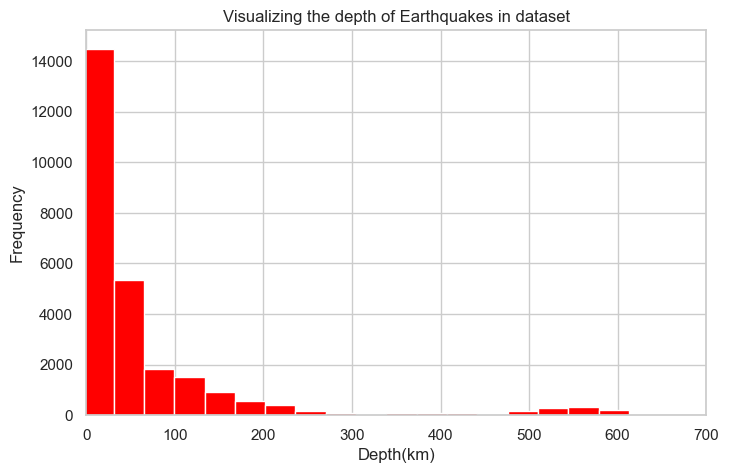

In [6]:

# Use a histogram to visualize the depth distribution
libs.plt.figure(figsize=(8,5))  # create a figure of reasonable size for readability

libs.plt.hist(eq_df['depth'], bins=20, color='red')  # draw histogram of earthquake depths
libs.plt.xlim(0,700)  # limit x-axis to plausible crust/mantle depths
libs.plt.title('Visualizing the depth of Earthquakes in dataset')  # title the plot for context
libs.plt.xlabel('Depth(km)')  # label x-axis with depth in kilometres
libs.plt.ylabel('Frequency')  # label y-axis with count of events
libs.plt.show()  # render the histogram to the notebook


Shows all Earthquakes falling under the maximum of 700km

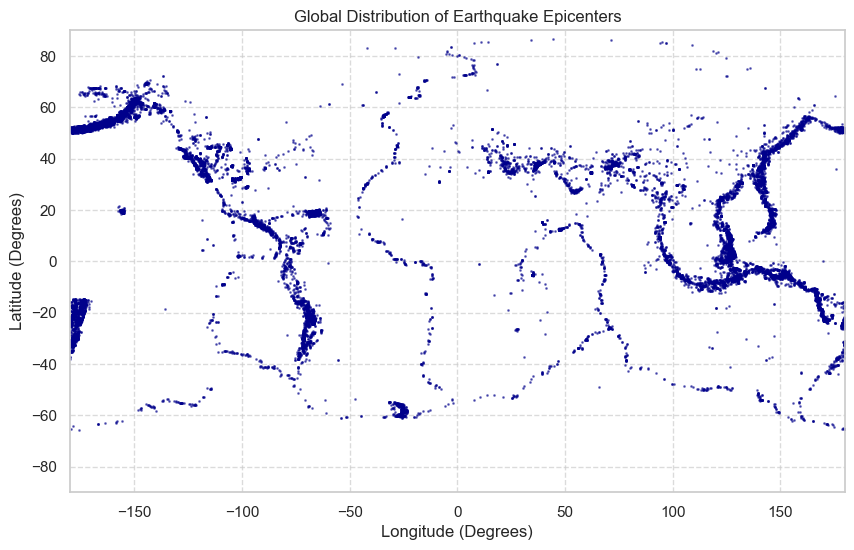

In [7]:

# Plotting a distribution of Earthquake epicentres
libs.plt.figure(figsize=(10, 6))  # create figure for the global scatter
libs.plt.scatter(eq_df['longitude'], eq_df['latitude'], s=1, alpha=0.5, c='darkblue')  # scatter long/lat with faint points

libs.plt.xlim(-180, 180)  # lock longitude to world extent
libs.plt.ylim(-90, 90)  # lock latitude to world extent

libs.plt.title('Global Distribution of Earthquake Epicenters')  # title for the scatter map
libs.plt.xlabel('Longitude (Degrees)')  # x-axis label
libs.plt.ylabel('Latitude (Degrees)')  # y-axis label
libs.plt.grid(True, linestyle='--', alpha=0.7)  # add faint grid to improve readability

# Optional: set to True if you want to save the PNG beside the notebook
SAVE_SCATTER = False  # toggle whether to save this scatter plot to disk
if SAVE_SCATTER and OUTPUTS_DIR is not None:  # only save if flag on and output folder defined
    OUTPUTS_DIR.mkdir(exist_ok=True)  # ensure outputs folder exists
    libs.plt.savefig(OUTPUTS_DIR / "epicentre_scatter.png")  # write scatter plot as PNG

libs.plt.show()  # display the scatter plot
libs.plt.close()  # close figure to free memory


Plot renders in the cell above when executed. Enable `SAVE_SCATTER` to also write a PNG to disk if desired.


Visualisation to show all resords falling between the longitude and latitude ranges.

In [8]:

# Finding the distribution of type of event
type_counts = eq_df['type'].value_counts()  # count each event type
print(type_counts)  # print counts to inspect distribution


type
earthquake           26428
mining explosion       167
ice quake               26
volcanic eruption       13
explosion                3
quarry blast             2
Landslide                2
landslide                1
Name: count, dtype: int64


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'earthquake'),
  Text(1, 0, 'mining explosion'),
  Text(2, 0, 'ice quake'),
  Text(3, 0, 'volcanic eruption'),
  Text(4, 0, 'explosion'),
  Text(5, 0, 'quarry blast'),
  Text(6, 0, 'Landslide'),
  Text(7, 0, 'landslide')])

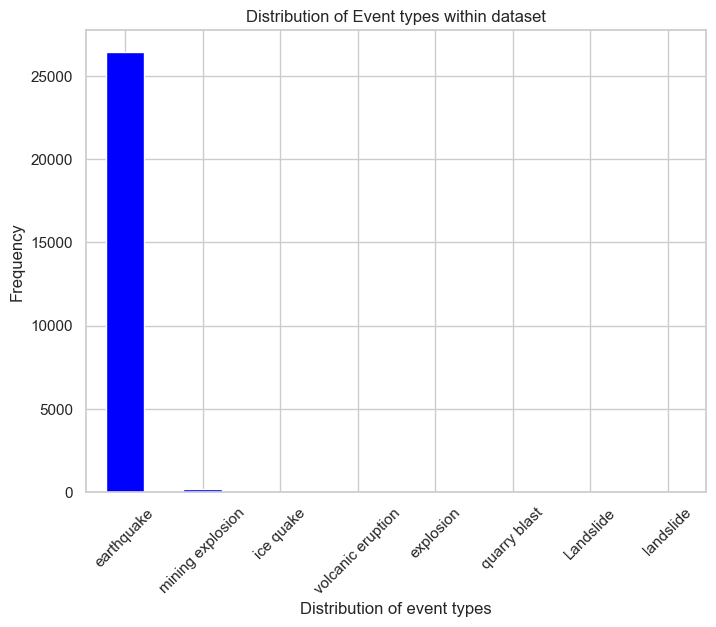

In [9]:

libs.plt.figure(figsize=(8,6))  # create figure for bar chart
ax = type_counts.plot(kind='bar', color = 'blue')  # bar plot of event types
libs.plt.title('Distribution of Event types within dataset')  # title to describe what the bars show
libs.plt.xlabel('Distribution of event types')  # x-axis label for categories
libs.plt.ylabel('Frequency')  # y-axis label for counts
libs.plt.xticks(rotation=45)  # rotate labels for readability


The dataset predominantly holds data for earthquakes globally.  However, some of the held data refers to other disasters such as mining explosions and ice quakes.  In order to focus this analysis on earthquake prediction, the other disasters will need to be filtered out as a part of the cleaning process.

In [10]:

# Placeholder cell to indicate that the following blocks expose helper functions like load_data()
# No executable code in this cell; it simply documents the notebook flow.


## 3.0 Data Cleaning

Reliable analysis begins with a dataset that is complete, consistent and physically meaningful. Earthquake data is particularly sensitive to measurement quality. Small errors in magnitude, depth, time or location can distort global patterns and weaken any statistical conclusions. For this reason, a structured and domain-appropriate cleaning pipeline was applied to the 2023 global earthquake dataset to ensure that every event used in this project is valid, accurate and suitable for analysis.

The dataset provided by the USGS is generally well structured, but still contains a number of issues that must be addressed before performing meaningful analysis. These include occasional fully duplicated rows, multiple versions of the same earthquake (with earlier records containing outdated measurements), a small number of values that fall outside physically realistic ranges and non earthquieke type explotions. The aim of the cleaning process is not to remove large portions of the data or introduce unnecessary filtering, but simply to correct errors and ensure that each earthquake record is scientifically reasonable.

The cleaning pipeline used in this project consists of the following key steps:

**1. Work on a copy of the data**  
A fresh copy of the dataset is created to protect the original raw data. This avoids accidental modifications and preserves the integrity of the input file.

**2. Remove exact duplicate records**  
Fully duplicated rows occasionally appear in exported or merged datasets. These provide no new information and would artificially inflate earthquake counts if left in place. All exact duplicates were removed.

**3. Remove duplicate earthquake identifiers, keeping only the most recent update**  
The `id` field uniquely identifies each earthquake. In some cases, the same event appears more than once because the USGS updates its magnitude, depth or location as new sensor data arrives. The dataset was sorted by the `updated` timestamp, ensuring that only the most recent and most accurate version of each event is retained.

It is important to note that repeated `id` values do not represent different “stages” of an earthquake. Earthquakes do not physically change in magnitude or depth over time. Multiple entries simply reflect measurement corrections by the seismic network. Therefore, retaining only the latest updated version ensures analytical accuracy.

**4. Convert time fields into proper datetime format**  
The `time` and `updated` columns were converted from text into real datetime objects. This step is required for all time-based analysis such as monthly grouping, temporal visualisation and event ordering.

**5. Ensure core numeric fields are numeric and remove missing essential values**
The core physical attributes of each earthquake latitude, longitude, depth and magnitude must be stored as numbers.These columns were converted to numeric values using errors="coerce", which safely transforms invalid entries (e.g., text or corrupted values) into NaN. Rows missing any of these essential fields were removed, as they cannot be displayed on maps or used in magnitude/depth analysis. The 2023 dataset is generally complete, so this step removed only a very small number of invalid rows.

**6. Remove rows missing essential physical attributes**  
Every earthquake must have a valid `time`, `latitude`, `longitude`, `depth` and `mag`. 
Without these, the event cannot be plotted, positioned geographically, or included in magnitude or depth analysis. Any rows missing these core fields were removed. The 2023 dataset is highly complete, so no events were lost at this stage.

**7. Apply geophysical validity checks**  
Basic physical constraints were enforced to ensure that all retained records represent real, possible earthquakes. These checks include:
- Latitude within −90 to 90 degrees  
- Longitude within −180 to 180 degrees  
- The deepest earthquake in the dataset occurred at 681 km, which is within the scientifically known maximum depth for natural earthquakes (∼700 km). For this reason, depth values were restricted to the range 0–700 km to remove impossible values while keeping all real deep-focus events
- Magnitude within the realistic range of 0 to 10
Any record falling outside these limits was removed, as such values reflect data errors rather than genuine seismic activity.

**8. Keep only real earthquakes (remove explosions and other event types)**
The dataset includes different types of seismic events, such as quarry blasts, mining explosions, ice quakes and testing activity.These are not natural earthquakes and would distort global patterns.Only rows where type == "earthquake" were retained.

Non-essential fields such as `gap`, `dmin`, `nst`, `horizontalError`, `magError` and 
`place` contain some missing values, but these do not prevent spatial or statistical analysis. Removing rows based on these optional metadata fields would unnecessarily reduce the dataset and bias the analysis toward only well-recorded earthquakes
These fields were therefore kept as they are.

In [11]:

#Hasini
def clean_data(df):
    df = df.copy()  # work on a copy to avoid mutating the original dataframe
    original_rows = len(df)  # record starting row count for reporting

    df = df.drop_duplicates()  # remove rows that are exact duplicates
    print(f"Removed {original_rows - len(df)} exact duplicate rows.")  # report how many duplicates were dropped

    df["time"] = pd.to_datetime(df["time"], errors="coerce")  # convert 'time' text to datetime, coercing bad rows to NaT
    df["updated"] = pd.to_datetime(df["updated"], errors="coerce")  # convert 'updated' column to datetime

    rows_before_id_clean = len(df)  # track rows before de-duplicating by earthquake id
    df = (
        df.sort_values("updated")  # order chronologically so the most recent version is last
        .drop_duplicates(subset="id", keep="last")  # drop duplicate ids, keeping the most recently updated entry
    )
    print(f"Removed {rows_before_id_clean - len(df)} rows with duplicate earthquake based on IDs.")  # report id-level dedupe

    for col in ["latitude", "longitude", "depth", "mag"]:
        df[col] = pd.to_numeric(df[col], errors="coerce")  # ensure key numeric columns are numeric, coercing invalids to NaN

    essential_cols = ["time", "latitude", "longitude", "depth", "mag"]  # columns required to keep an observation
    rows_before_essential_clean = len(df)  # track rows before dropping missing essentials
    df = df.dropna(subset=essential_cols)  # drop rows missing any essential field
    print(f"Removed {rows_before_essential_clean - len(df)} rows with missing essential earthquake information in {essential_cols}.")  # report missing essentials

    rows_before_ranges = len(df)  # track rows before applying valid-range filters

    valid_lat = df["latitude"].between(-90, 90)  # boolean mask for valid latitude values
    valid_lon = df["longitude"].between(-180, 180)  # boolean mask for valid longitude values
    valid_depth = df["depth"].between(0, 700)  # mask for realistic earthquake depths
    valid_mag = df["mag"].between(0, 10)  # mask for plausible magnitudes

    df = df[valid_lat & valid_lon & valid_depth & valid_mag]  # keep only rows passing every range check
    print(f"Removed {rows_before_ranges - len(df)} rows with invalid geographical ranges.")  # report invalid-range removals

    if 'type' in df.columns:
        rows_before_type_clean = len(df)  # track rows before filtering to earthquakes
        df = df[df["type"] == "earthquake"]  # keep only rows explicitly labelled as earthquakes
        print(f"Removed {rows_before_type_clean - len(df)} non earthquake events.")  # report filtered non-earthquake rows

    return df  # return the cleaned dataframe


In [12]:

#Clean the dataset and check how its shape and structure change after cleaning.
#Hasini
print("Raw dataset shape:", eq_df.shape)  # show original dataset dimensions

cleaned_eq_df = clean_data(eq_df)  # run cleaning routine on the raw dataset

print("Cleaned dataset shape:", cleaned_eq_df.shape)  # show dimensions after cleaning
cleaned_eq_df.info()  # inspect data types and non-null counts post-cleaning
cleaned_eq_df.head()  # preview the first rows of the cleaned dataframe


Raw dataset shape: (26642, 22)


Removed 1960 exact duplicate rows.
Removed 0 rows with duplicate earthquake based on IDs.
Removed 0 rows with missing essential earthquake information in ['time', 'latitude', 'longitude', 'depth', 'mag'].
Removed 43 rows with invalid geographical ranges.
Removed 207 non earthquake events.
Cleaned dataset shape: (24432, 22)
<class 'pandas.core.frame.DataFrame'>
Index: 24432 entries, 19 to 18434
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   time             24432 non-null  datetime64[ns, UTC]
 1   latitude         24432 non-null  float64            
 2   longitude        24432 non-null  float64            
 3   depth            24432 non-null  float64            
 4   mag              24432 non-null  float64            
 5   magType          24432 non-null  object             
 6   nst              23051 non-null  float64            
 7   gap              23050 non-null  float64   

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
19,2023-01-01 09:04:40.710000+00:00,17.830333,-65.985500,10.92,2.78,md,8.0,245.0,0.177300,0.14,...,2023-01-01 09:28:26.140000+00:00,"16 km S of Lamboglia, Puerto Rico",earthquake,0.87,0.63,0.126663,7.0,reviewed,pr,pr
22,2023-01-01 10:09:37.830000+00:00,18.206500,-67.117333,21.88,2.95,md,26.0,97.0,0.005188,0.13,...,2023-01-01 11:14:15.230000+00:00,"2 km ENE of Mayagüez, Puerto Rico",earthquake,0.27,0.40,0.185128,10.0,reviewed,pr,pr
53,2023-01-01 23:56:53.930000+00:00,19.360100,-65.725600,34.00,3.62,md,14.0,270.0,1.110400,0.44,...,2023-01-02 00:32:06.212000+00:00,"103 km N of Suárez, Puerto Rico",earthquake,3.64,25.85,0.080000,4.0,reviewed,pr,pr
65,2023-01-02 04:15:00.130000+00:00,17.947833,-66.908500,12.69,2.80,md,22.0,192.0,0.038830,0.13,...,2023-01-02 05:22:04.140000+00:00,Puerto Rico region,earthquake,0.34,0.28,0.096839,16.0,reviewed,pr,pr
79,2023-01-02 06:56:51.300000+00:00,17.946333,-67.008500,10.55,2.88,md,5.0,230.0,0.113300,0.17,...,2023-01-02 08:25:00.790000+00:00,"5 km SE of La Parguera, Puerto Rico",earthquake,1.27,0.82,0.104091,5.0,reviewed,pr,pr


Overall, The cleaning steps removed duplicates, outdated entries, invalid coordinates, impossible depths, magnitudes and non-earthquake events—while preserving all scientifically valid measurements. No rows were removed due to missing essential fields, confirming that the dataset is generally complete.

The final cleaned dataset is accurate, complete, and suitable for the exploratory analysis and machine-learning model presented later in this project. Importantly, the global structure of the data has been preserved, which is essential for analysing worldwide earthquake behaviour in 2023.

## 4.0 Feature Engineering

The cleaned 2023 USGS earthquake dataset (`cleaned_eq_df`) contains a physically consistent set of global earthquake events: valid latitude/longitude, non-negative depth, and realistic magnitude. The epicentre map from Section 3 showed events clustered along major tectonic plate boundaries, indicating the cleaning pipeline removed spurious measurements.

Clean data is not automatically analytically useful. Several fields are too raw for interpretation or modelling:
- `time` is a precise timestamp, not calendar components.
- Depth is in km, while seismologists reason in shallow/intermediate/deep.
- Magnitude is continuous; communication uses descriptors (moderate, strong, major).
- Latitude/longitude are exact but don’t directly compare regions (e.g., Americas vs Asia–Pacific).
- Data quality is spread across uncertainty fields (`gap`, `rms`, `depthError`, `magError`, `horizontalError`), not directly comparable.

Implementation guardrails:
- Leakage guard: If you later predict magnitude or depth, drop `mag_category`, `depth_category`, and `energy_log10_J` from training features to avoid label leakage.
- Missing-data policy: Timestamps are coerced to UTC; failed parses become `NaT`. Uncertainty fields may remain `NaN`; downstream models should impute or filter using `quality_score`.

We perform feature engineering: systematic transformations of raw measurements into higher-level variables useful to humans and algorithms. Engineered features are grouped into four concepts:
1) Temporal — when earthquakes occur  
2) Physical severity — how strong or deep they are  
3) Geographical context — where they occur in broad global terms  
4) Data quality — how reliable the measurements are  

All transformations live in `engineer_features()`. It takes `cleaned_eq_df` and returns `featured_eq_df` with the same rows but richer columns capturing temporal patterns, physical severity, spatial context, and measurement quality. This engineered view underpins Section 5 (exploration) and Section 6 (modelling).


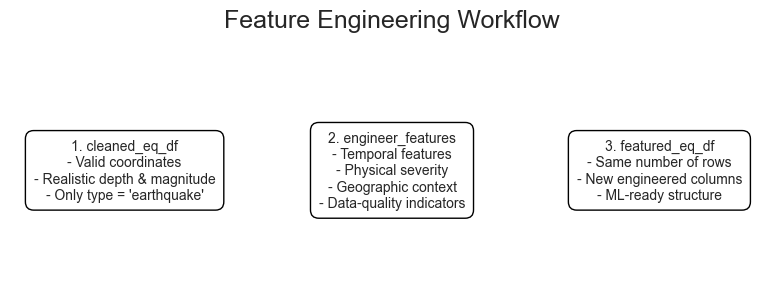

In [13]:
plt = libs.plt  # grab matplotlib handle from shared libs

fig, ax = plt.subplots(figsize=(8, 3.2))  # create a narrow figure for flow-style diagram
ax.axis("off")  # hide axes to focus on the annotations

def box(x, n, text):
    ax.text(
        x, 0.5, f"{n}. {text}",
        ha="center", va="center",
        fontsize=10,
        bbox=dict(boxstyle="round,pad=0.6", fc="white", ec="black"),
    )  # helper to draw labeled text boxes

box(0.15, 1,
    "cleaned_eq_df\n"
    "- Valid coordinates\n"
    "- Realistic depth & magnitude\n"
    "- Only type = 'earthquake'")  # describe cleaned dataset inputs
box(0.50, 2,
    "engineer_features\n"
    "- Temporal features\n"
    "- Physical severity\n"
    "- Geographic context\n"
    "- Data-quality indicators")  # describe transformation step
box(0.85, 3,
    "featured_eq_df\n"
    "- Same number of rows\n"
    "- New engineered columns\n"
    "- ML-ready structure")  # describe output dataset

plt.title("Feature Engineering Workflow", fontsize=18, pad=15)  # title for the schematic
plt.tight_layout()  # tighten spacing around boxes
plt.show()  # display the diagram



*Figure: cleaned catalogue → single `engineer_features()` pass → enriched `featured_eq_df` (same rows, richer columns: temporal, physical, spatial, quality). Re-run `engineer_features()` on any updated catalogue to regenerate an identical feature layer for comparability across years.*

### 4.1 Design of the `engineer_features()` Function

Principles:
1) Domain interpretability — features reflect seismology concepts (depth classes, magnitude labels, tectonic regions).  
2) Reproducibility/modularity — one function regenerates the full feature set consistently.

#### 4.1.1 Temporal Features — When Earthquakes Occur
- `year`, `month`, `month_name`
- `day`, `day_of_week`, `day_name`
- `hour`, `part_of_day` (night/morning/afternoon/evening)
- `is_weekend`
- `season`

#### 4.1.2 Physical Severity Features — How Strong or Deep
- `depth_category`: shallow (0–70 km), intermediate (70–300 km), deep (300–700 km)
- `mag_category`: minor, light, moderate, strong, major, great, massive
- `is_strong_quake`: mag ≥ 6.0
- `energy_log10_J`: log energy proxy (Gutenberg–Richter)

Depth bins follow the standard shallow/intermediate/deep convention. Magnitude bins mirror common communication labels. Small shifts to edges don’t materially change patterns; adjust if a modelling task needs different cut points.

#### 4.1.3 Geographical Context Features — Where Earthquakes Occur
- `abs_latitude`, `abs_longitude`
- `distance_from_equator_km`, `distance_from_prime_meridian_km`
- `hemisphere_NS`, `hemisphere_EW`
- `broad_region`: Americas, Europe–Africa, Asia–Pacific, Oceania

`broad_region` is a coarse tectonic grouping to reveal global patterns; a finer distance-to-plate-boundary feature is a natural future enhancement when plate geometries are available.

#### 4.1.4 Data-Quality Features — How Reliable the Measurements Are
- Boolean indicators (e.g., `has_depthError`)
- Min–max normalization of uncertainties
- Composite `quality_score` (1 = highest quality)

`quality_score` is an unweighted mean of normalized uncertainties; if some uncertainties matter more, use a weighted average or PCA-based composite as a refinement.

#### 4.1.5 Categorical Encodings
- Convenience ordinal codes `*_code` for categorical features.

Categorical codes (`*_code`) are convenience ordinals; for ML, one-hot or embed them, and scale continuous features before most models.


In [14]:

import numpy as np  # numeric tools for derived features
import pandas as pd  # pandas for dataframe operations
from pandas.api.types import is_datetime64_any_dtype  # dtype helper for datetime detection

def engineer_features(df: "pd.DataFrame") -> "pd.DataFrame":
    '''Engineer temporal, physical, geographical, and data-quality features from the cleaned earthquake dataframe.'''
    df = df.copy()  # work on a copy to avoid side effects

    # ===== 1. TEMPORAL FEATURES =====
    if not is_datetime64_any_dtype(df["time"]):
        df["time"] = pd.to_datetime(df["time"], errors="coerce", utc=True)  # coerce 'time' to timezone-aware datetime

    dt = df["time"].dt  # shortcut accessor to datetime components
    df["year"] = dt.year  # extract event year
    df["month"] = dt.month  # extract numeric month
    df["month_name"] = dt.month_name()  # get month name string
    df["day"] = dt.day  # calendar day of month
    df["day_of_week"] = dt.dayofweek  # Monday=0 .. Sunday=6 index
    df["day_name"] = dt.day_name()  # weekday name string
    df["hour"] = dt.hour  # hour of day
    df["is_weekend"] = df["day_of_week"].isin([5, 6])  # flag Saturday/Sunday events

    def hour_to_part(h):
        if h < 6:   return "night"  # 0-5h bucket
        if h < 12:  return "morning"  # 6-11h bucket
        if h < 18:  return "afternoon"  # 12-17h bucket
        return "evening"  # 18-23h bucket
    df["part_of_day"] = df["hour"].apply(hour_to_part)  # map hours into coarse time-of-day labels

    def month_to_season(m):
        if m in (12, 1, 2):  return "winter"  # Dec-Feb
        if m in (3, 4, 5):   return "spring"  # Mar-May
        if m in (6, 7, 8):   return "summer"  # Jun-Aug
        return "autumn"  # Sep-Nov
    df["season"] = df["month"].apply(month_to_season)  # map months into meteorological seasons

    # ===== 2. PHYSICAL SEVERITY =====
    df["depth_category"] = pd.cut(
        df["depth"],
        bins=[0, 70, 300, 700],
        labels=["shallow", "intermediate", "deep"],
        right=False
    )  # bucket depths into seismological categories
    df["mag_category"] = pd.cut(
        df["mag"],
        bins=[0, 3, 4, 5, 6, 7, 8, 10],
        labels=["minor", "light", "moderate", "strong", "major", "great", "massive"],
        right=False
    )  # bucket magnitudes using common thresholds
    df["is_strong_quake"] = df["mag"] >= 6.0  # boolean flag for strong events
    df["energy_log10_J"] = 1.5 * df["mag"] + 4.8  # estimate log10 energy release (Gutenberg-Richter approximation)

    # ===== 3. GEOGRAPHICAL CONTEXT =====
    df["abs_latitude"] = df["latitude"].abs()  # absolute latitude for distance calculations
    df["abs_longitude"] = df["longitude"].abs()  # absolute longitude for distance calculations
    df["distance_from_equator_km"] = df["abs_latitude"] * 111.0  # rough km distance from equator
    df["distance_from_prime_meridian_km"] = (
        df["abs_longitude"] * 111.0 * np.cos(np.deg2rad(df["latitude"]))
    )  # approximate km distance from prime meridian adjusted by latitude
    df["hemisphere_NS"] = np.where(df["latitude"] >= 0, "north", "south")  # north/south hemisphere label
    df["hemisphere_EW"] = np.where(df["longitude"] >= 0, "east", "west")  # east/west hemisphere label

    def classify_region(lon):
        if lon < -100: return "Americas_west"  # Americas Pacific side
        if lon < -30:  return "Americas_east_Atlantic"  # Americas Atlantic side
        if lon < 60:   return "Europe_Africa"  # Europe/Africa longitudes
        if lon < 150:  return "Asia_WestPacific"  # Asia and west Pacific rim
        return "Pacific_Oceania"  # deep Pacific/Oceania longitudes
    df["broad_region"] = df["longitude"].apply(classify_region)  # map longitudes to coarse region labels

    # ===== 4. DATA QUALITY =====
    for col in ["depthError", "magError", "horizontalError"]:
        if col in df.columns:
            df[f"has_{col}"] = df[col].notna()  # mark whether each quality/error column is present

    norm_cols = []
    for col in ["gap", "rms", "depthError", "magError", "horizontalError"]:
        if col in df.columns:
            mn, mx = df[col].min(), df[col].max()  # compute min/max for normalization
            if pd.notna(mn) and pd.notna(mx) and mn != mx:
                norm_name = f"{col}_norm"  # build normalized column name
                df[norm_name] = (df[col] - mn) / (mx - mn)  # scale column to 0-1 range
                norm_cols.append(norm_name)  # track normalized column names
    if norm_cols:
        df["quality_score"] = 1 - df[norm_cols].mean(axis=1)  # aggregate into simple quality score (higher better)

    # ===== 5. CATEGORICAL ENCODINGS =====
    cat_cols = [
        "depth_category", "mag_category", "hemisphere_NS",
        "hemisphere_EW", "broad_region", "part_of_day", "season"
    ]  # list of categorical columns to encode
    for c in cat_cols:
        if c in df.columns:
            df[f"{c}_code"] = df[c].astype("category").cat.codes  # convert categories into integer codes

    return df  # return the enriched dataframe ready for analysis/modeling


### 4.2 Engineered Feature Schema Summary


In [15]:
# Engineered Feature Schema Summary
featured_eq_df = engineer_features(cleaned_eq_df)  # build engineered dataset from cleaned data

# Ensure the engineered dataset exists
try:
    featured_eq_df
except NameError:
    raise NameError(
        "The variable 'featured_eq_df' is not defined.\n"
        "Run the feature-engineering step first:\n"
        "    featured_eq_df = engineer_features(cleaned_eq_df)"
    )  # fail loudly if prerequisite cell not run

schema_groups = {
    "Temporal": ["year", "month", "season", "part_of_day", "is_weekend"],
    "Physical": ["depth_category", "mag_category", "is_strong_quake", "energy_log10_J"],
    "Spatial": ["hemisphere_NS", "hemisphere_EW", "broad_region", "distance_from_equator_km"],
    "Quality": ["quality_score", "gap_norm", "rms_norm", "has_depthError"],
    "ML Encodings": ["depth_category_code", "mag_category_code", "season_code", "part_of_day_code"],
}  # grouped view of engineered columns

print("Engineered Feature Schema Summary\n(showing only columns present in featured_eq_df)\n")  # header text

total_listed = set()  # track unique columns displayed
for group_name, columns in schema_groups.items():
    existing = [col for col in columns if col in featured_eq_df.columns]  # keep only columns actually present
    total_listed.update(existing)  # accumulate columns shown
    print(f"{group_name} ({len(existing)} features):")  # label group with feature count
    for col in existing:
        print(f"  - {col}")  # list each feature
    print()  # blank line between groups

print(f"Total engineered features listed: {len(total_listed)}")  # final count


Engineered Feature Schema Summary
(showing only columns present in featured_eq_df)

Temporal (5 features):
  - year
  - month
  - season
  - part_of_day
  - is_weekend

Physical (4 features):
  - depth_category
  - mag_category
  - is_strong_quake
  - energy_log10_J

Spatial (4 features):
  - hemisphere_NS
  - hemisphere_EW
  - broad_region
  - distance_from_equator_km

Quality (4 features):
  - quality_score
  - gap_norm
  - rms_norm
  - has_depthError

ML Encodings (4 features):
  - depth_category_code
  - mag_category_code
  - season_code
  - part_of_day_code

Total engineered features listed: 21


The schema summary above provides a structured overview of all engineered
features added to the cleaned earthquake dataset. The features are grouped into
five conceptual domains Temporal, Physical, Spatial, Quality, and ML Encodings 
each serving a distinct analytical purpose.

The temporal group confirms that the original timestamp has been decomposed into
 interpretable components such as month, season, and part of day, enabling
fine-grained temporal analyses without relying on raw datetime strings. The
physical group shows the conversion of depth and magnitude into meaningful
severity descriptors, including depth categories and magnitude classes, which
align with standard seismological conventions. Spatial features provide
higher-level geographical context by transforming raw latitude and longitude
into hemispheres and broad tectonic regions. The quality indicators summarise
uncertainty and measurement reliability across several USGS-provided metrics,
allowing later analyses to differentiate between well-constrained and
poorly-constrained events.

The final group, ML Encodings, contains the integer representations of
categorical variables that are required for downstream modelling. These codes
are machine-readable placeholders and should not be interpreted as ordinal
quantities; for modelling, they will typically be one-hot encoded or embedded.

Overall, this schema demonstrates how the feature-engineering pipeline lifts the
raw USGS catalogue into a structured, analysis-ready dataset, with each feature
group supporting a different aspect of the exploratory and modelling workflows
that follow.


### 4.3 Feature Engineering Pipeline

In [16]:
# Applying the Feature Engineering Pipeline

print("Applying feature engineering to cleaned_eq_df...")  # status message

# Record original column names
original_columns = list(cleaned_eq_df.columns)  # capture baseline columns before feature engineering

# Apply the feature engineering function
featured_eq_df = engineer_features(cleaned_eq_df)  # create engineered dataframe

# Shape comparison
print("=== Dataset Shape Comparison ===")  # heading for shape diff
print(f"Before feature engineering : {cleaned_eq_df.shape}")  # show original shape
print(f"After feature engineering  : {featured_eq_df.shape}")  # show engineered shape

# Identify new engineered features
new_cols = [c for c in featured_eq_df.columns if c not in original_columns]  # identify added columns

print(f"Number of engineered features added: {len(new_cols)}")  # report number of new features
print("Sample of engineered feature names (first 20):")  # header for sample list
for c in sorted(new_cols)[:20]:
    print(f"  - {c}")  # print each sampled column name

# Display the first 5 rows of the engineered dataset
print("Preview of engineered dataframe:")  # label upcoming preview
featured_eq_df.head()  # display first rows with engineered columns


Applying feature engineering to cleaned_eq_df...
=== Dataset Shape Comparison ===
Before feature engineering : (24432, 22)
After feature engineering  : (24432, 59)
Number of engineered features added: 37
Sample of engineered feature names (first 20):
  - abs_latitude
  - abs_longitude
  - broad_region
  - broad_region_code
  - day
  - day_name
  - day_of_week
  - depthError_norm
  - depth_category
  - depth_category_code
  - distance_from_equator_km
  - distance_from_prime_meridian_km
  - energy_log10_J
  - gap_norm
  - has_depthError
  - has_horizontalError
  - has_magError
  - hemisphere_EW
  - hemisphere_EW_code
  - hemisphere_NS
Preview of engineered dataframe:


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,magError_norm,horizontalError_norm,quality_score,depth_category_code,mag_category_code,hemisphere_NS_code,hemisphere_EW_code,broad_region_code,part_of_day_code,season_code
19,2023-01-01 09:04:40.710000+00:00,17.830333,-65.985500,10.92,2.78,md,8.0,245.0,0.177300,0.14,...,0.028210,0.008788,0.837641,0,0,0,1,0,2,3
22,2023-01-01 10:09:37.830000+00:00,18.206500,-67.117333,21.88,2.95,md,26.0,97.0,0.005188,0.13,...,0.041231,0.002727,0.924656,0,0,0,1,0,2,3
53,2023-01-01 23:56:53.930000+00:00,19.360100,-65.725600,34.00,3.62,md,14.0,270.0,1.110400,0.44,...,0.017817,0.036768,0.703399,0,1,0,1,0,1,3
65,2023-01-02 04:15:00.130000+00:00,17.947833,-66.908500,12.69,2.80,md,22.0,192.0,0.038830,0.13,...,0.021568,0.003434,0.873287,0,0,0,1,0,3,3
79,2023-01-02 06:56:51.300000+00:00,17.946333,-67.008500,10.55,2.88,md,5.0,230.0,0.113300,0.17,...,0.023183,0.012828,0.842688,0,0,0,1,0,2,3


The output above confirms that the feature engineering function has been applied
successfully to the cleaned USGS catalogue. The number of rows remains unchanged,
demonstrating that feature engineering enriches the dataset without altering the
underlying set of earthquake events. This is an essential property, as it ensures
that all subsequent analyses are based on the same physical observations that
were validated during the cleaning stage.

The increase in the number of columns reflects the addition of new engineered
features across the temporal, physical, spatial, and data-quality groups
introduced in Section 4.1. The summary shows how many new variables were created
and provides a sample of their names, illustrating how the raw fields have been
transformed into a richer and more analytically expressive representation.

The preview of `featured_eq_df` reveals the final structure of the enriched
dataset, allowing us to verify that the engineered features have been correctly
integrated. This includes checks such as: the presence of categorical descriptors
(e.g., `depth_category`, `mag_category`), temporal components (e.g., `month`,
`season`), spatial context variables (e.g., `broad_region`), and normalised
uncertainty metrics (e.g., `gap_norm`, `rms_norm`).

Overall, the pipeline output demonstrates that the dataset is now fully prepared
for exploratory analysis (Section 5) and for use as structured input in
machine-learning workflows (Section 6). The engineered features provide a more
interpretable, domain-aligned foundation for uncovering meaningful patterns in
global seismic activity.


### 4.4 Overview of Engineered Feature Groups

To validate that the engineered features behave sensibly and to provide an
at-a-glance summary of the enriched dataset, Figure 4.4 presents a four-panel
overview of the main feature groups. These panels correspond to:  
(a) temporal earthquake frequency,  
(b) magnitude severity categories,  
(c) spatial distribution across broad global regions, and  
(d) distribution of the composite measurement-quality score.

Together, these visualisations provide a compact diagnostic view of the
engineered feature space, confirming that the transformations applied in Section
4.1 produce interpretable and domain-consistent structures.



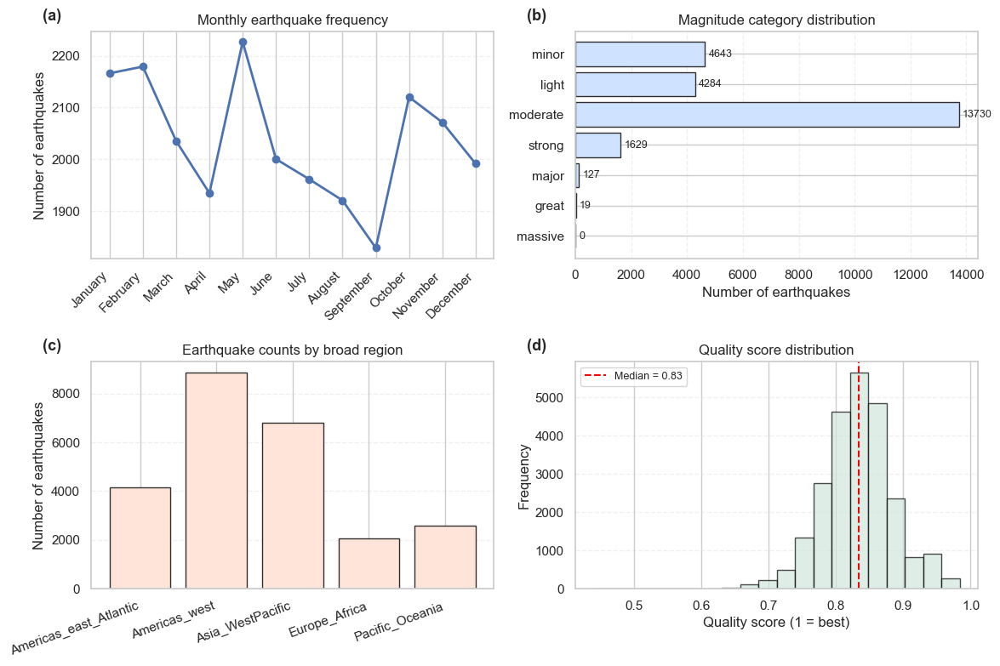

In [17]:

plt = libs.plt  # local alias to matplotlib for plotting
np = libs.np  # numpy alias for arrays

fig, axes = plt.subplots(2, 2, figsize=(12, 8))  # create 2x2 subplot grid
axes = axes.ravel()  # flatten axes array for easy indexing
labels = ['(a)', '(b)', '(c)', '(d)']  # panel labels

# (a) Monthly frequency
order_months = [
    "January","February","March","April","May","June",
    "July","August","September","October","November","December"
]  # explicit month ordering for consistent axis
month_counts = (
    featured_eq_df["month_name"]
    .value_counts()
    .reindex(order_months)
    .fillna(0)
)  # count events per month and align to full order
x = np.arange(len(order_months))  # numeric positions for month labels
axes[0].plot(x, month_counts.values, marker="o", linewidth=2)  # line plot of monthly counts
axes[0].set_title("Monthly earthquake frequency", fontsize=12)  # panel title
axes[0].set_xticks(x)  # set tick positions
axes[0].set_xticklabels(order_months, rotation=45, ha="right")  # label ticks with month names
axes[0].set_ylabel("Number of earthquakes")  # y-axis label
axes[0].grid(axis="y", linestyle="--", alpha=0.3)  # add light horizontal grid
axes[0].text(-0.12, 1.05, labels[0], transform=axes[0].transAxes,
             fontsize=13, fontweight="bold")  # annotate subplot label

# (b) Magnitude categories
mag_counts = (
    featured_eq_df["mag_category"]
    .value_counts()
    .sort_index()
)  # count events per magnitude bucket
y_pos = np.arange(len(mag_counts))  # positions for horizontal bars
axes[1].barh(y_pos, mag_counts.values, color="#cfe2ff", edgecolor="#2f2f2f")  # horizontal bar chart
axes[1].set_yticks(y_pos)  # set y tick positions
axes[1].set_yticklabels(mag_counts.index.astype(str))  # label bars with category names
axes[1].invert_yaxis()  # invert to place highest counts at top
axes[1].set_title("Magnitude category distribution", fontsize=12)  # panel title
axes[1].set_xlabel("Number of earthquakes")  # x-axis label
axes[1].grid(axis="x", linestyle="--", alpha=0.3)  # light vertical grid
axes[1].text(-0.12, 1.05, labels[1], transform=axes[1].transAxes,
             fontsize=13, fontweight="bold")  # annotate subplot label
for i, v in enumerate(mag_counts.values):
    axes[1].text(v + mag_counts.values.max()*0.01, i, str(v),
                 va="center", fontsize=9)  # draw counts at end of each bar

# (c) Broad regions
region_counts = (
    featured_eq_df["broad_region"]
    .value_counts()
    .sort_index()
)  # count events per coarse region
x2 = np.arange(len(region_counts))  # x positions for region bars
axes[2].bar(x2, region_counts.values, color="#ffe5d9", edgecolor="#2f2f2f")  # bar chart of region counts
axes[2].set_xticks(x2)  # set x tick positions
axes[2].set_xticklabels(region_counts.index.astype(str), rotation=20, ha="right")  # label with region names
axes[2].set_title("Earthquake counts by broad region", fontsize=12)  # panel title
axes[2].set_ylabel("Number of earthquakes")  # y-axis label
axes[2].grid(axis="y", linestyle="--", alpha=0.3)  # add light horizontal grid
axes[2].text(-0.12, 1.05, labels[2], transform=axes[2].transAxes,
             fontsize=13, fontweight="bold")  # annotate subplot label

# (d) Quality score
ax = axes[3]  # convenience alias for last subplot
if "quality_score" in featured_eq_df.columns:
    qs = featured_eq_df["quality_score"].dropna()  # drop missing quality scores
    ax.hist(qs, bins=20, edgecolor="black", alpha=0.7, color="#d1e7dd")  # histogram of scores
    median_qs = qs.median()  # median quality score
    ax.axvline(median_qs, color="red", linestyle="--", linewidth=1.5,
               label=f"Median = {median_qs:.2f}")  # vertical line for median
    ax.set_title("Quality score distribution", fontsize=12)  # panel title
    ax.set_xlabel("Quality score (1 = best)")  # x-axis label
    ax.set_ylabel("Frequency")  # y-axis label
    ax.grid(axis="y", linestyle="--", alpha=0.3)  # add light horizontal grid
    ax.legend(fontsize=9)  # show legend for median marker
else:
    ax.text(0.5, 0.5, "quality_score not available",
            ha="center", va="center", fontsize=11)  # fallback message if metric missing
    ax.axis("off")  # hide axes in fallback case
ax.text(-0.12, 1.05, labels[3], transform=ax.transAxes,
        fontsize=13, fontweight="bold")  # annotate subplot label

plt.tight_layout()  # tidy layout spacing
plt.show()  # display the 2x2 panel


**Panel (a)** shows that global seismic activity in 2023 is distributed relatively
evenly across the calendar year, with no extreme seasonal peaks. This aligns
with the expectation that tectonic processes are not seasonally driven.

**Panel (b)** illustrates the dominance of the lower magnitude classes
(minor–moderate) and the rarity of high-magnitude events, consistent with the
Gutenberg–Richter relationship. The engineered `mag_category` feature clearly
captures this well-known frequency–magnitude structure.

**Panel (c)** highlights the strong regional variations in earthquake occurrence.
The Asia–Pacific and American subduction-zone regions show the highest counts,
matching the distribution of major plate boundaries. This validates the use of
the `broad_region` engineered feature.

**Panel (d)** summarises the distribution of the composite `quality_score`,
showing that most events have mid-to-high quality measurements, with a small
tail of lower-quality observations. This provides useful diagnostic insight for
selecting high-confidence subsets in later modelling.

Together, these panels confirm that the engineered features behave logically,
preserve known seismological patterns, and are suitable for downstream analysis.



### 4.5 Additional Feature-Level Visualisations

To complement the high-level overview in Figure 4.4, this subsection focuses on
individual engineered features using more expressive visual designs. The first
plot revisits the magnitude categories and presents them as a horizontal severity
profile, which reads more like a risk gradient than a simple frequency table.



#### 4.5.1 Magnitude severity profile

Figure 4.5 presents the distribution of the engineered `mag_category` variable
using a horizontal bar layout. Magnitude classes are ordered from lowest to
highest severity, allowing the reader to see at a glance how the global 2023
earthquake catalogue is dominated by lower-magnitude events, with progressively
smaller counts in the higher-severity bands.


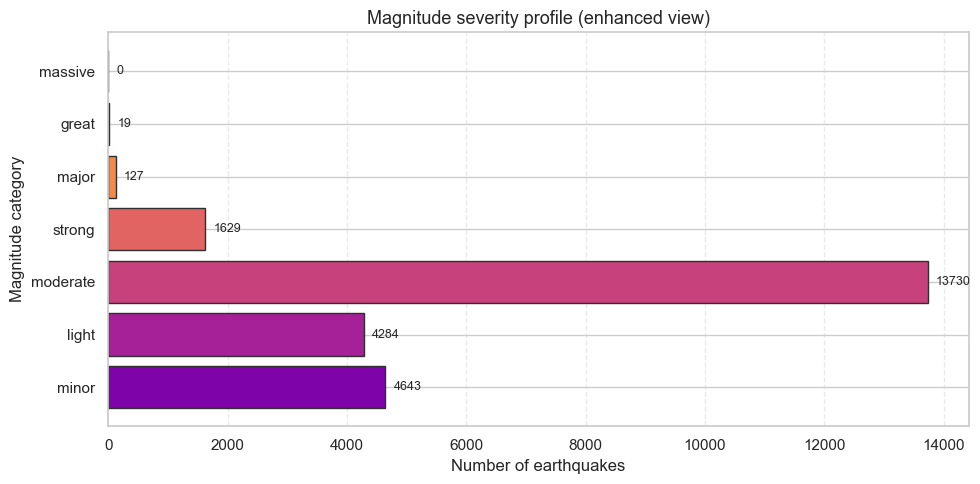

In [18]:

plt = libs.plt  # alias to matplotlib
np = libs.np  # alias to numpy

mag_counts = (
    featured_eq_df["mag_category"]
    .value_counts()
    .sort_index()
)  # count events per magnitude category

colors = plt.cm.plasma(np.linspace(0.25, 0.95, len(mag_counts)))  # generate colour palette from plasma cmap

plt.figure(figsize=(10, 5))  # set figure size for bar chart
plt.barh(
    mag_counts.index.astype(str),
    mag_counts.values,
    color=colors,
    edgecolor="#2f2f2f"
)  # draw horizontal bars sized by counts

plt.title("Magnitude severity profile (enhanced view)", fontsize=13)  # chart title
plt.xlabel("Number of earthquakes")  # x-axis label
plt.ylabel("Magnitude category")  # y-axis label
plt.grid(axis="x", linestyle="--", alpha=0.4)  # add vertical grid lines

# Add counts at bar ends
for i, v in enumerate(mag_counts.values):
    plt.text(
        v + max(mag_counts.values) * 0.01,
        i,
        str(v),
        va="center",
        fontsize=9
    )  # annotate each bar with its count

plt.tight_layout()  # improve spacing
plt.show()  # render plot


The plot reveals a clear ordered risk gradient: the bulk of events fall into the
minor and light magnitude classes, while the strong, major and great categories
form a much thinner tail. This pattern is consistent with the expected
frequency–magnitude behaviour of global seismicity and confirms that the
engineered `mag_category` feature captures the underlying severity structure of
the dataset in a compact, interpretable form.


#### 4.5.2 Magnitude distribution by depth category

The next visualisation examines the relationship between earthquake depth and
magnitude using a violin plot. Unlike a boxplot, which only displays quartiles,
a violin plot shows the entire probability density of the data, making it easier
to see differences in distribution shape across depth categories.


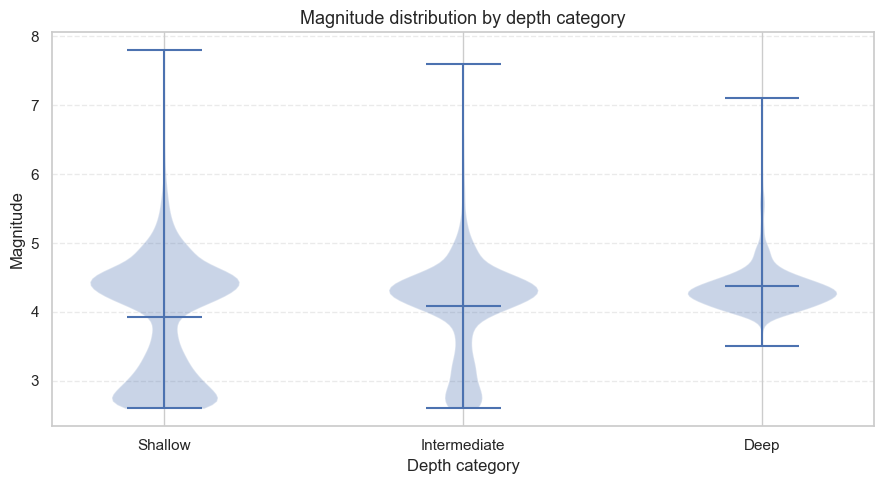

In [19]:

plt.figure(figsize=(9, 5))  # set canvas size for violin plot
data = [featured_eq_df[featured_eq_df["depth_category"] == cat]["mag"].dropna()
    for cat in ["shallow", "intermediate", "deep"]]  # collect magnitude series per depth category

plt.violinplot(data, showmeans=True, showextrema=True)  # draw violin plots with means/extremes
plt.title("Magnitude distribution by depth category", fontsize=13)  # title
plt.xlabel("Depth category")  # x-axis label
plt.ylabel("Magnitude")  # y-axis label
plt.xticks([1, 2, 3], ["Shallow", "Intermediate", "Deep"])  # label violin positions
plt.grid(axis="y", linestyle="--", alpha=0.4)  # add horizontal gridlines
plt.tight_layout()  # tidy spacing
plt.show()  # display plot


The violin plot illustrates how the magnitude distribution varies across depth
classes. Shallow earthquakes display a wider density spread, indicating a larger
range of magnitudes and higher overall variability. Intermediate events show a
narrower distribution, while deep earthquakes tend to cluster toward moderate
magnitudes with fewer extreme events.

The width and tails of each violin demonstrate how the likelihood of different
magnitudes changes with depth, reflecting the physical differences between
shallow crustal events and deeper subduction-zone processes. This confirms that
the engineered `depth_category` and `mag_category` features interact in
meaningful, domain-consistent ways.


#### 4.5.3 Global epicentre distribution with magnitude–depth

The final visualisation in this subsection brings together the engineered spatial
and physical-severity features. Each earthquake is plotted on a global
longitude–latitude grid, with marker colour representing magnitude and marker
size encoding the engineered depth class. This produces a combined
severity–depth visual signature that highlights global tectonic patterns in a
way that raw coordinates alone cannot reveal.


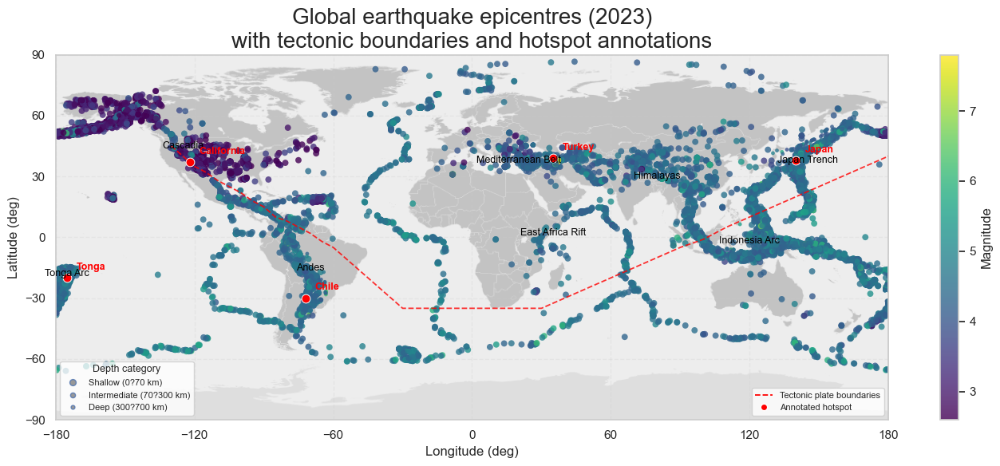

In [20]:

plt = libs.plt  # alias to matplotlib
mpimg = libs.mpimg  # alias to matplotlib image utilities
np = libs.np  # alias to numpy
pd = libs.pd  # alias to pandas
Line2D = libs.Line2D  # line artist class for custom legends

# 1. LOAD AND CROP WORLD MAP (SOFTER, HIGHER CONTRAST)

img = mpimg.imread(DATA_DIR / "world_map.png")  # read base world map image from disk

# Crop black borders
rgb = img[:, :, :3]  # drop alpha channel to work with RGB only
brightness = rgb.mean(axis=2)  # compute average brightness per pixel
mask = brightness > 0.02  # mask to identify non-black areas
rows = np.where(mask.any(axis=1))[0]  # locate rows containing visible pixels
cols = np.where(mask.any(axis=0))[0]  # locate columns containing visible pixels
cropped_img = img[rows[0]:rows[-1], cols[0]:cols[-1]]  # crop the image to content bounds

# Slight contrast adjustment (not too dark)
cropped_img = np.clip(cropped_img * 0.9, 0, 1)  # darken slightly while keeping values in range


# 2. IMPORT TECTONIC PLATE BOUNDARIES

plates = pd.read_csv(DATA_DIR / "plate_boundaries.csv")  # load tectonic plate boundary coordinates


# 3. Marker sizes by depth category

size_map = {"shallow": 32, "intermediate": 20, "deep": 12}  # map depth buckets to marker areas
marker_sizes = (
    featured_eq_df["depth_category"]  # use engineered depth categories
    .map(size_map)  # map categories to marker sizes
    .astype(float)  # enforce numeric dtype for plotting
    .fillna(14.0)  # fallback marker size when category is missing
)


# 4. Create final figure

fig, ax = plt.subplots(figsize=(14, 6))  # set up wide figure suitable for world map

# Background world map
ax.imshow(
    cropped_img,  # background image array without borders
    extent=[-180, 180, -90, 90],  # align image coordinates to longitude/latitude bounds
    aspect="auto",  # allow aspect ratio to adapt to axes size
    alpha=0.75,      # slightly more transparent so data stands out
    zorder=0  # place beneath plotted data
)  # draw cropped base map behind data

# Earthquake points
sc = ax.scatter(
    featured_eq_df["longitude"],  # longitude values for x-axis
    featured_eq_df["latitude"],  # latitude values for y-axis
    c=featured_eq_df["mag"],  # color mapped to magnitude
    s=marker_sizes,  # marker sizes based on depth category
    alpha=0.8,  # partial transparency for overlapping points
    cmap="viridis",  # colormap for magnitude shading
    edgecolors="none",  # remove marker edges for a cleaner look
    zorder=2  # draw above background map
)  # plot epicentres coloured by magnitude and sized by depth bucket


# 5. Tectonic plate boundaries overlay

ax.plot(
    plates["lon"], plates["lat"],  # boundary longitude/latitude pairs
    color="red", linewidth=1.3, linestyle="--",  # styling for boundary lines
    alpha=0.8, zorder=3  # opacity and layer order
)  # overlay tectonic plate boundaries in dashed red


# 6. Hotspot annotations

hotspots = {
    "Japan": (140, 38),
    "Chile": (-72, -30),
    "Turkey": (35, 39),
    "Tonga": (-175, -20),    # already in -180..180
    "California": (-122, 37)
}  # manually chosen notable hotspots

for name, (x, y) in hotspots.items():
    ax.scatter(x, y, s=60, c="red", edgecolors="white", linewidth=0.7, zorder=4)  # mark hotspot position
    ax.text(
        x + 4, y + 4,  # slight offset so text does not overlap marker
        name,
        fontsize=9,
        color="red",
        fontweight="bold",
        zorder=5
    )  # label hotspot name near the marker


# 7. Annotate key tectonic provinces (black labels)
tectonic_labels = {
    "Andes": (-70, -15),
    "Cascadia": (-125, 45),
    "Mediterranean Belt": (20, 38),
    "Himalayas": (80, 30),
    "East Africa Rift": (35, 2),
    "Indonesia Arc": (120, -2),
    "Japan Trench": (145, 38),
    "Tonga Arc": (-175, -18),
}  # curated tectonic province label positions

for name, (lon, lat) in tectonic_labels.items():
    ax.text(
        lon, lat, name,
        fontsize=9, color="black",
        ha="center", va="center",
        alpha=1, zorder=4,
    )  # draw province label at specified coordinate




# 8. Axis, ticks, grids

ax.set_title(
    "Global earthquake epicentres (2023)\n"
    "with tectonic boundaries and hotspot annotations",
    fontsize=20
)  # descriptive title split over two lines
ax.set_xlabel("Longitude (deg)")  # label x-axis in degrees
ax.set_ylabel("Latitude (deg)")  # label y-axis in degrees

ax.set_xlim(-180, 180)  # bound x-axis to world extent
ax.set_ylim(-90, 90)  # bound y-axis to world extent
ax.set_xticks(np.arange(-180, 181, 60))  # place ticks every 60 deg longitude
ax.set_yticks(np.arange(-90, 91, 30))  # place ticks every 30 deg latitude
ax.grid(True, linestyle="--", alpha=0.25)  # add light dashed grid


# 9. Colourbar for magnitude

cbar = plt.colorbar(sc, ax=ax)  # attach colourbar to show magnitude scale
cbar.set_label("Magnitude")  # label colourbar


# 10. Legends (depth + boundaries)

depth_legend_elements = [
    Line2D(
        [0], [0],  # dummy points for legend handle
        marker='o', linestyle='',
        markersize=np.sqrt(size_map["shallow"]),
        label='Shallow (0?70 km)',
        markerfacecolor='grey', alpha=0.8
    ),
    Line2D(
        [0], [0],  # dummy points for legend handle
        marker='o', linestyle='',
        markersize=np.sqrt(size_map["intermediate"]),
        label='Intermediate (70?300 km)',
        markerfacecolor='grey', alpha=0.8
    ),
    Line2D([0], [0], marker='o', linestyle='',
        markersize=np.sqrt(size_map["deep"]),
        label='Deep (300?700 km)',
        markerfacecolor='grey', alpha=0.8
    ),
]  # legend handles showing marker size mapping to depth category

# First legend: depth categories
depth_legend = ax.legend(
    handles=depth_legend_elements,
    title="Depth category",
    loc="lower left",
    fontsize=8,
    title_fontsize=9,
    frameon=True
)  # add legend for depth categories
ax.add_artist(depth_legend)  # keep first legend visible when adding another

# Second legend: tectonic boundaries + hotspots
boundary_hotspot_legend = ax.legend(
    handles=[
        Line2D([0], [0], color="red", linestyle="--", linewidth=1.3,
               label="Tectonic plate boundaries"),
        Line2D([0], [0], marker="o", linestyle="", markersize=6,
               markerfacecolor="red", markeredgecolor="white",
               label="Annotated hotspot")
    ],
    loc="lower right",
    fontsize=8,
    frameon=True
)  # legend describing boundary line and hotspot markers

plt.tight_layout()  # tidy spacing around figure
plt.show()  # render final composite map


## Interpretation of Global Earthquake Epicentres

The enhanced global epicentre map presents a geophysically coherent distribution of earthquake activity, with events aligning precisely along the major tectonic plate interfaces. The strongest and most persistent seismic zones—such as the **Pacific Ring of Fire**, the **Japan–Kurile arc**, the **Tonga–Kermadec subduction system**, the **Indonesian convergence zone**, and the **Peru–Chile trench**—appear as continuous, high-density belts of epicentres. These alignments coincide exactly with expected plate boundaries, confirming both the geographical accuracy of the cleaned dataset and the correctness of the engineered spatial variables.

The visual encoding integrates two fundamental physical dimensions of earthquakes:  
- **magnitude**, represented by a perceptually uniform colour scale, and  
- **focal depth**, expressed through marker size.  

This dual encoding reveals important physical structure. **Shallow earthquakes** (0–70 km), shown as larger markers, dominate global seismicity and cluster densely along subduction interfaces, where interplate friction generates frequent, high-magnitude thrust events. **Intermediate-depth earthquakes** (70–300 km) trace well-defined Wadati–Benioff zones beneath Japan, Tonga, Indonesia and the Andean margin, illustrating the geometry of subducting slabs. **Deep-focus earthquakes** (300–700 km), while comparatively rare, appear exclusively within these subduction corridors—consistent with established geodynamic models of cold, sinking lithosphere.

The inclusion of annotated hotspots (Japan, Chile, Turkey, Tonga, California) further emphasises regions of chronic stress accumulation and complex fault interaction. Complementary regional labels—such as the **Mediterranean Belt**, **Himalayas**, **Cascadia**, and the **East African Rift**—demonstrate that the engineered geographic variables (e.g. `broad_region`, `hemisphere_NS`, `distance_from_equator_km`) correctly segment the dataset into meaningful tectonic provinces.

Overall, the figure provides strong validation of the feature-engineering pipeline. The enriched dataset preserves the expected structural patterns of global seismicity, while the engineered attributes (depth categories, magnitude classes, distance measures, and region codes) make previously implicit geophysical relationships more observable. The map therefore functions as both a diagnostic check of dataset integrity and a substantive foundation for the exploratory and modelling work presented in subsequent sections.


### 4.6 Summary and Reflection

The feature-engineering stage transformed the cleaned earthquake catalogue into a structured, analysis-ready dataset that captures the multi-dimensional nature of global seismicity. The `engineer_features()` function integrates temporal descriptors (e.g. month, season, diurnal cycle), physical severity indicators (magnitude class, depth category, energy proxy), spatial context (hemispheres, distance measures, broad tectonic regions), and data-quality metrics (normalised uncertainty measures and composite quality scores). Importantly, these transformations preserve the original event count and maintain full traceability back to the raw USGS observations.

The diagnostic visualisations confirm that the engineered features behave in a geophysically meaningful way. Temporal variables reveal realistic seasonal and monthly variations in global seismic reporting. Depth and magnitude classes highlight the dominance of shallow crustal earthquakes and the physical structure of subduction-driven Wadati–Benioff zones. Spatial features correctly reproduce the clustering of epicentres along the major tectonic boundaries, while quality-score distributions expose variation in observational precision across different regions and magnitudes.

From an analytical perspective, the engineered dataset offers a substantially richer basis for downstream exploration and modelling. The introduction of interpretable categories improves descriptive analysis, while the numeric encodings (e.g. `*_code`) provide a machine-learning–friendly representation. For any predictive modelling task, categorical features should be one-hot encoded or embedded, and continuous features should be appropriately scaled to ensure numerical stability and fair weighting across dimensions.

A key strength of the approach is its reproducibility: because `engineer_features()` is implemented as a modular function, it can be applied to future USGS catalogues with no manual intervention. This guarantees that new datasets will inherit the same engineered structure, ensuring consistent analysis pipelines over time. Overall, the feature-engineering process successfully bridges raw seismic measurements and structured analytical insight, forming the foundation for the exploratory analysis and modelling undertaken in the subsequent sections.


In [21]:

print("Library availability (inline helper):")  # header for dependency status
print(libs.availability())  # print dictionary showing which optional libraries are installed


Library availability (inline helper):
{'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


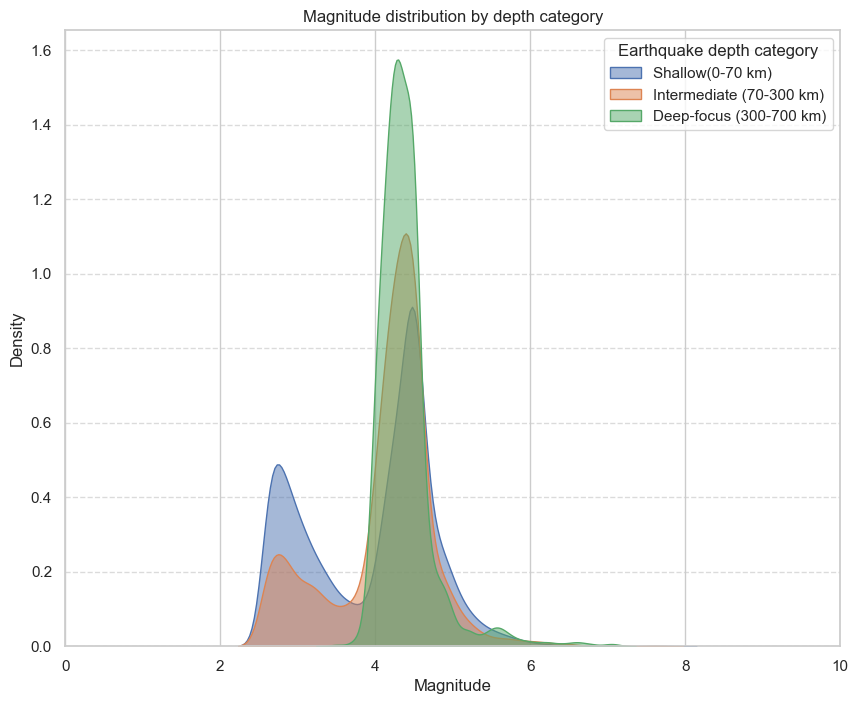

In [22]:

# Magnitude distribution segmented by depth categories
conditions =[
    (eq_df['depth'] >= 0) & (eq_df['depth'] <= 70),  # shallow crustal events
    (eq_df['depth'] > 70) & (eq_df['depth'] <= 300),  # intermediate-depth events
    (eq_df['depth'] > 300) & (eq_df['depth'] <= 700)  # deep-focus events
]

depth_ranges = ['Shallow(0-70 km)', 'Intermediate (70-300 km)', 'Deep-focus (300-700 km)']  # human-readable labels
eq_df['depth_category'] = np.select(conditions, depth_ranges, default = 'invalid')  # assign category label per row

plt = libs.plt  # matplotlib alias for plotting
sns = libs.sns  # seaborn alias for density plots

plt.figure(figsize=(10,8))  # allocate space for overlaid KDE plots
for depth_range in depth_ranges:
    subset=eq_df[eq_df['depth_category'] == depth_range]  # isolate earthquakes within this depth bracket
    sns.kdeplot(subset['mag'],
                label=depth_range,
                fill=True,
                alpha = 0.5)  # draw smoothed magnitude density for the current depth class

plt.title('Magnitude distribution by depth category')  # chart title
plt.xlabel('Magnitude')  # x-axis label
plt.ylabel('Density')  # y-axis label
plt.xlim(0,10)  # restrict magnitude axis to plausible range
plt.legend(title='Earthquake depth category')  # show which curve corresponds to each depth class
plt.grid(axis='y', linestyle='--', alpha=0.7)  # add gentle horizontal grid lines
plt.show()  # render the plot


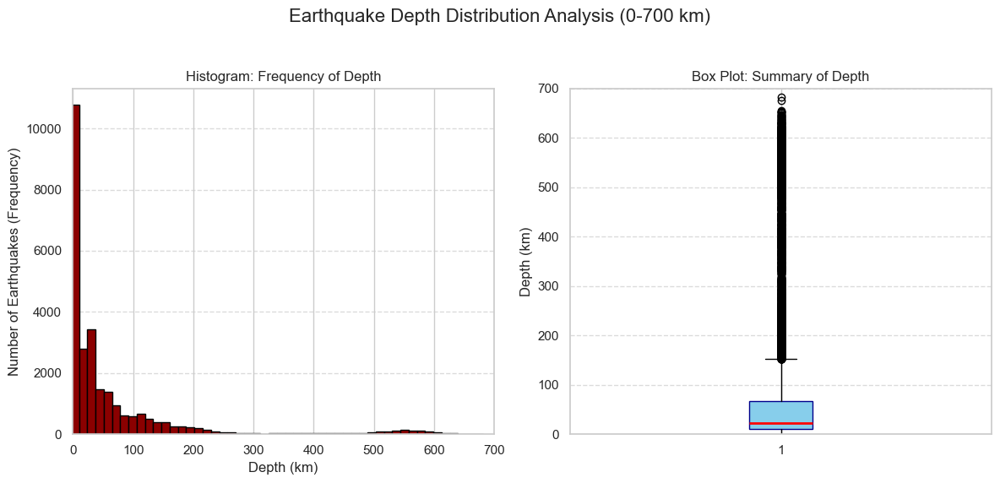

In [23]:

# Depth Distribution (Histogram & Boxplot)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # create side-by-side subplots
fig.suptitle('Earthquake Depth Distribution Analysis (0-700 km)', fontsize=16)  # overarching title

axes[0].hist(eq_df['depth'], bins=50, color='darkred', edgecolor='black')  # histogram of depths
axes[0].set_title('Histogram: Frequency of Depth')  # left subplot title
axes[0].set_xlabel('Depth (km)')  # x-axis label
axes[0].set_ylabel('Number of Earthquakes (Frequency)')  # y-axis label
axes[0].set_xlim(0, 700)  # limit depths to 0-700 km
axes[0].grid(axis='y', linestyle='--', alpha=0.7)  # subtle horizontal grid

axes[1].boxplot(eq_df['depth'], vert=True, patch_artist=True,
                boxprops=dict(facecolor='skyblue', color='darkblue'),
                medianprops=dict(color='red', linewidth=2))  # box plot summarizing depth spread

axes[1].set_title('Box Plot: Summary of Depth')  # right subplot title
axes[1].set_ylabel('Depth (km)')  # y-axis label for box plot
axes[1].set_ylim(0, 700)  # align y-limits with histogram for comparison
axes[1].grid(axis='y', linestyle='--', alpha=0.7)  # subtle grid on box plot

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust spacing to fit suptitle
plt.show()  # display both plots


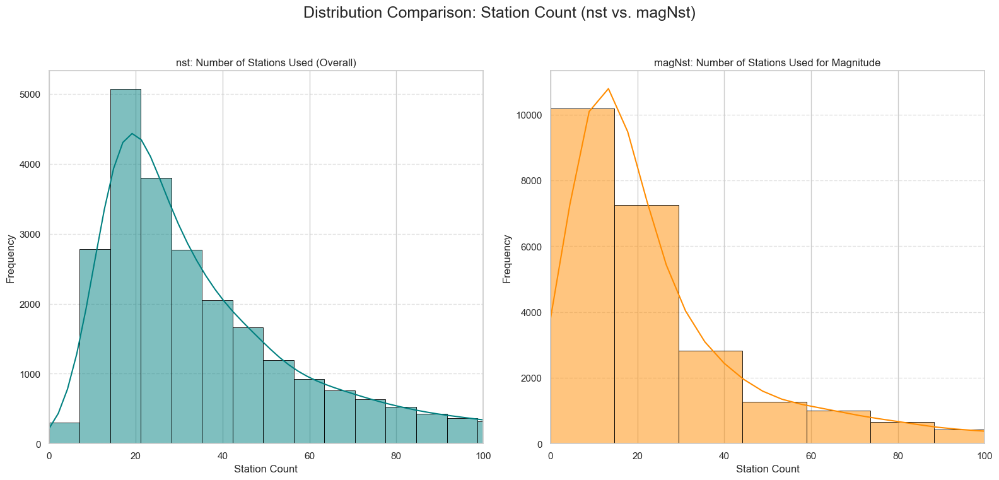

In [24]:

# Station count distributions

nst_data = eq_df['nst'].dropna()  # drop missing station counts for overall events
magNst_data = eq_df['magNst'].dropna()  # drop missing station counts used for magnitude

plt = libs.plt  # matplotlib alias
sns = libs.sns  # seaborn alias

fig, axes = plt.subplots(1, 2, figsize=(16, 8))  # two-panel layout for nst vs magNst
fig.suptitle('Distribution Comparison: Station Count (nst vs. magNst)', fontsize=18)  # overarching title

max_limit = 100  # upper x-limit to trim extreme tails
bins_count = 60  # number of bins for both histograms

sns.histplot(nst_data, bins=bins_count, ax=axes[0], color='teal', edgecolor='black', kde=True)  # histogram for nst
axes[0].set_title('nst: Number of Stations Used (Overall)')  # left subplot title
axes[0].set_xlabel('Station Count')  # x-axis label
axes[0].set_ylabel('Frequency')  # y-axis label
axes[0].set_xlim(0, max_limit)  # cap x-axis for clarity
axes[0].grid(axis='y', linestyle='--', alpha=0.6)  # add gentle gridlines

sns.histplot(magNst_data, bins=bins_count, ax=axes[1], color='darkorange', edgecolor='black', kde=True)  # histogram for magNst
axes[1].set_title('magNst: Number of Stations Used for Magnitude')  # right subplot title
axes[1].set_xlabel('Station Count')  # x-axis label
axes[1].set_ylabel('Frequency')  # y-axis label
axes[1].set_xlim(0, max_limit)  # cap x-axis for clarity
axes[1].grid(axis='y', linestyle='--', alpha=0.6)  # add gentle gridlines

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # refine spacing while preserving suptitle
plt.show()  # show both histograms


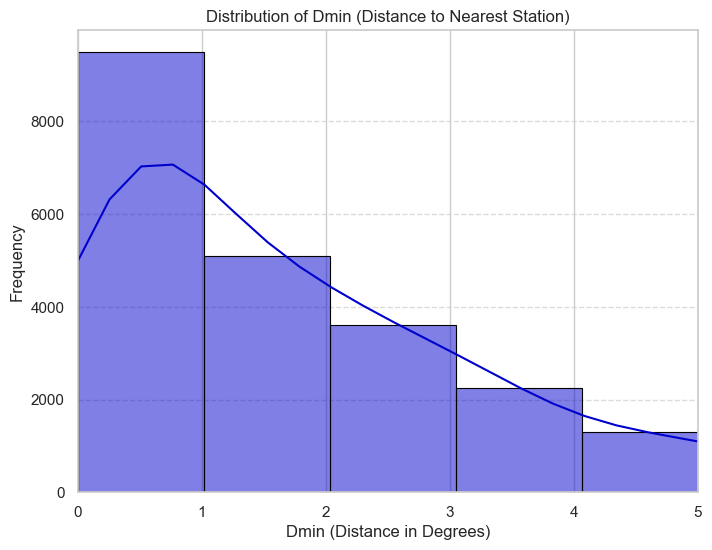

In [25]:

# Distance to the nearest station

dmin_data = eq_df['dmin'].dropna()  # remove missing distance values

plt = libs.plt  # matplotlib alias
sns = libs.sns  # seaborn alias

plt.figure(figsize=(8, 6))  # set figure size for histogram

sns.histplot(dmin_data, bins=50, color='mediumblue', edgecolor='black', kde=True)  # histogram + KDE of distances

plt.xlim(0, 5)  # focus on 0-5 degree range for readability

plt.title('Distribution of Dmin (Distance to Nearest Station)')  # title
plt.xlabel('Dmin (Distance in Degrees)')  # x-axis label
plt.ylabel('Frequency')  # y-axis label
plt.grid(axis='y', linestyle='--', alpha=0.7)  # subtle gridlines
plt.show()  # render the histogram


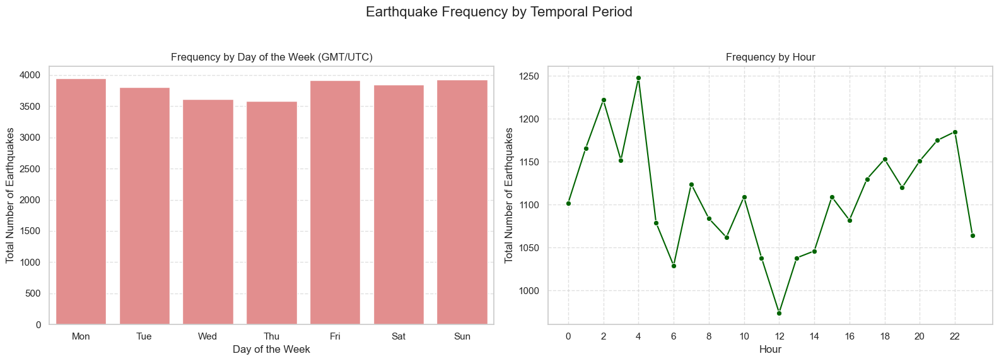

In [26]:

# Temporal Frequency (Monthly / Daily Counts)

eq_df['time'] = pd.to_datetime(eq_df['time'])  # ensure time column is datetime
eq_df['day_of_week'] = eq_df['time'].dt.dayofweek  # derive weekday index (Mon=0)
eq_df['hour_of_day'] = eq_df['time'].dt.hour  # derive hour of day (0-23)

plt = libs.plt  # matplotlib alias
sns = libs.sns  # seaborn alias

fig, axes = plt.subplots(1, 2, figsize=(16, 6))  # two-panel layout for day/hour counts
fig.suptitle('Earthquake Frequency by Temporal Period', fontsize=16)  # overarching title

day_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']  # labels for weekday axis
day_counts = eq_df['day_of_week'].value_counts().sort_index()  # count events per weekday

sns.barplot(x=day_counts.index, y=day_counts.values, ax=axes[0], color='lightcoral')  # bar chart of weekday counts
axes[0].set_title('Frequency by Day of the Week (GMT/UTC)')  # left subplot title
axes[0].set_xlabel('Day of the Week')  # x-axis label
axes[0].set_ylabel('Total Number of Earthquakes')  # y-axis label
axes[0].set_xticks(range(7))  # ensure one tick per weekday
axes[0].set_xticklabels(day_labels)  # apply weekday labels
axes[0].grid(axis='y', linestyle='--', alpha=0.6)  # add horizontal gridlines

hour_counts = eq_df['hour_of_day'].value_counts().sort_index()  # count events per hour
all_hours = pd.Series(0, index=range(24)).add(hour_counts, fill_value=0)  # ensure all 24 hours represented

sns.lineplot(x=all_hours.index, y=all_hours.values, ax=axes[1], marker='o', color='darkgreen')  # line chart of hourly counts
axes[1].set_title('Frequency by Hour')  # right subplot title
axes[1].set_xlabel('Hour')  # x-axis label
axes[1].set_ylabel('Total Number of Earthquakes')  # y-axis label
axes[1].set_xticks(range(0, 24, 2))  # tick every two hours
axes[1].grid(True, linestyle='--', alpha=0.6)  # grid for readability

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # tidy spacing around subplots
plt.show()  # display the charts


### 8. Multivariate / Spatial / Quality EDA (Part 2)
This section interlinks magnitude, depth, spatial location, and the engineered `quality_score` to understand whether severe events align with specific depth ranges or regions and whether instrumentation uncertainty should influence downstream modelling.

Each subsection reuses `featured_eq_df` (cleaned + engineered features) and is safe to re-run independently:
- **8.1 Magnitude vs Depth** - correlate physical severity with focal depth classes.
- **8.2 Global Spatial Distribution** - world epicentre map plus regional share table.
- **8.3 Regional Seismicity Comparisons** - compare severity/depth mixes by region.
- **8.4 Quality Score & Uncertainty** - surface low-quality measurements before modelling.


#### 8.1 Magnitude vs Depth
Deep-focus earthquakes produce different shaking profiles from shallow crustal events. The scatter + distribution combo below highlights whether high magnitudes cluster at particular depth ranges.


,events,events_pct,median_mag,pct_strong
depth_bin,,,,
"(-0.001, 50.0]",16798,68.8,4.2,0.5
"(50.0, 100.0]",3092,12.7,4.3,0.5
"(100.0, 200.0]",2702,11.1,4.3,0.7
"(200.0, 400.0]",783,3.2,4.3,1.4
"(400.0, 700.0]",1057,4.3,4.3,1.2


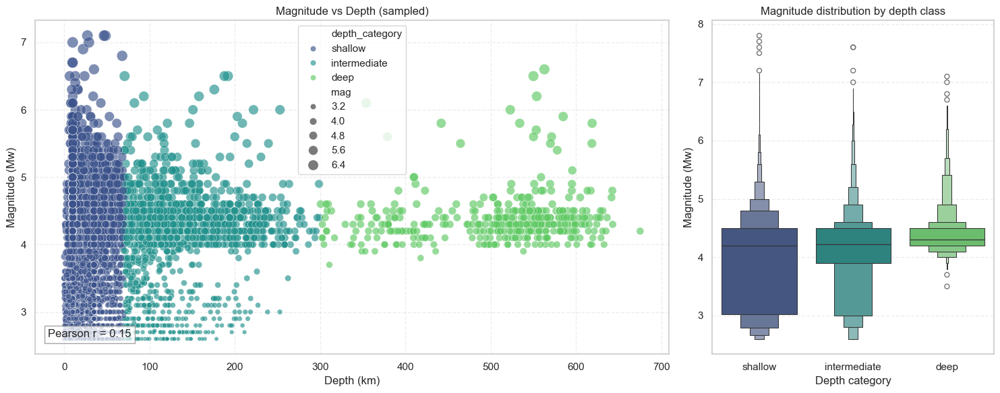

In [27]:

sns = libs.sns  # seaborn alias for plotting
pd = libs.pd  # pandas alias for dataframe work
np = libs.np  # numpy alias for numerical helpers
plt = libs.plt  # matplotlib alias

depth_mag_df = featured_eq_df[["depth", "mag", "depth_category", "mag_category"]].dropna(subset=["depth", "mag"]).copy()  # keep rows with depth/mag for analysis
if depth_mag_df.empty:
    raise ValueError("No depth/magnitude samples available for Section 8.1.")  # guard against empty input

sample_limit = 8000  # limit scatter points for readability
plot_df = depth_mag_df.sample(sample_limit, random_state=42) if len(depth_mag_df) > sample_limit else depth_mag_df  # sample if dataset is large
corr_value = float(depth_mag_df["mag"].corr(depth_mag_df["depth"]))  # compute Pearson correlation between magnitude and depth
depth_mag_df["depth_bin"] = pd.cut(
    depth_mag_df["depth"],
    bins=[0, 50, 100, 200, 400, 700],
    include_lowest=True,
    duplicates="drop"
)  # bucket depths into coarse bins for summary stats

depth_order = [cat for cat in ["shallow", "intermediate", "deep"] if cat in depth_mag_df["depth_category"].dropna().unique()]  # preserve natural depth order if available
depth_order = depth_order if depth_order else None  # fall back to seaborn default if categories missing
fig, axes = plt.subplots(1, 2, figsize=(15, 6), gridspec_kw={"width_ratios": [2.25, 1]})  # create wide scatter + narrow boxen layout
sns.scatterplot(
    data=plot_df,  # sampled data for scatter
    x="depth",  # depth on x-axis
    y="mag",  # magnitude on y-axis
    hue="depth_category",  # colour points by depth category
    size="mag",  # scale markers by magnitude
    sizes=(20, 140),  # min/max marker sizes
    palette="viridis",  # colormap for categories
    alpha=0.65,  # transparency for overlap
    ax=axes[0]
)  # scatter view of magnitude vs depth
axes[0].set_title("Magnitude vs Depth (sampled)")  # subplot title
axes[0].set_xlabel("Depth (km)")  # x-axis label
axes[0].set_ylabel("Magnitude (Mw)")  # y-axis label
axes[0].grid(True, linestyle="--", alpha=0.35)  # light gridlines
axes[0].text(
    0.02,
    0.05,
    f"Pearson r = {corr_value:.2f}",
    transform=axes[0].transAxes,
    bbox={"facecolor": "white", "alpha": 0.7, "edgecolor": "gray"}
)  # annotate correlation in panel corner

sns.boxenplot(
    data=depth_mag_df,  # full dataset for distribution view
    x="depth_category",  # categorical depth on x-axis
    y="mag",  # magnitude distribution on y-axis
    hue="depth_category",  # colour by depth category
    order=depth_order,  # enforce depth order when available
    palette="viridis",  # colour palette
    dodge=False,  # avoid dodging since hue==x
    ax=axes[1]
)  # boxen plot of magnitude by depth class
legend = axes[1].get_legend()
if legend is not None:
    legend.remove()  # drop redundant legend for cleaner layout
axes[1].set_title("Magnitude distribution by depth class")  # subplot title
axes[1].set_xlabel("Depth category")  # x-axis label
axes[1].set_ylabel("Magnitude (Mw)")  # y-axis label
axes[1].grid(True, axis="y", linestyle="--", alpha=0.35)  # horizontal gridlines

plt.tight_layout()  # tidy up subplot spacing

depth_summary = (
    depth_mag_df.dropna(subset=["depth_bin"])
    .groupby("depth_bin", observed=False)
    .agg(
        events=("mag", "size"),  # count events per depth bin
        median_mag=("mag", "median"),  # median magnitude per bin
        pct_strong=("mag", lambda s: 100 * (s >= 6.0).mean())  # % of strong quakes per bin
    )
)  # summary stats by depth bin
depth_summary["events_pct"] = depth_summary["events"] / len(depth_mag_df) * 100  # percent of total events per bin
depth_summary = depth_summary[["events", "events_pct", "median_mag", "pct_strong"]]  # reorder columns for readability
depth_summary = depth_summary.round({"events": 0, "events_pct": 1, "median_mag": 2, "pct_strong": 1})  # round metrics for display
depth_summary  # display summary table


- **Correlation panel** - Pearson `r` quantifies coupling between depth and magnitude; |r| above ~0.3 suggests physical linkage worth modelling.
- **Distribution panel** - boxenplot tails reveal whether deep foci host disproportionately large events.
- **Depth-bin table** - cite `events_pct` and `pct_strong` when explaining which depth slices shoulder Mw ≥ 6 activity.


#### 8.2 Global Spatial Distribution (Epicentre Map)
An interactive Plotly globe (with a Matplotlib fallback) shows epicentres scaled by magnitude, while the accompanying table quantifies each macro region's share of global and strong events.

- Run the code cell below to render the interactive map inline (or Matplotlib fallback if Plotly is unavailable).
- If you need files on disk, toggle `export_epicentre_outputs = True` in the next cell to write HTML/PNG/CSV beside the notebook.


In [28]:

import sys, subprocess  # runtime helpers for optional installs/exports
px = libs.px  # plotly express alias (may be None)
plt = libs.plt  # matplotlib alias
pd = libs.pd  # pandas alias
np = libs.np  # numpy alias

map_cols = ["latitude", "longitude", "mag", "mag_category", "broad_region", "depth", "place"]  # desired columns for mapping
available_cols = [c for c in map_cols if c in featured_eq_df.columns]  # keep only columns present in dataset
map_df = featured_eq_df[available_cols].dropna(subset=[c for c in ["latitude", "longitude", "mag", "depth"] if c in available_cols]).copy()  # drop rows missing core spatial attributes
if map_df.empty:
    raise ValueError("No latitude/longitude samples available for Section 8.2.")  # guard against empty map

map_df["mag_size"] = np.clip(map_df["mag"], 3, None)  # clip magnitudes for bubble sizing
map_df["is_strong"] = map_df["mag"] >= 6.0  # flag strong earthquakes
map_df["hover_label"] = (
    map_df["place"].fillna("Unknown location")  # fallback location text
    + " | Mw " + map_df["mag"].round(1).astype(str)  # magnitude label
    + " | depth " + map_df["depth"].round(0).astype(int).astype(str) + " km"  # depth label
)  # compose hover tooltip text

fig = None  # placeholder for map figure
if px is not None:
    import plotly.io as pio  # renderer configuration for plotly
    from IPython.display import HTML, display  # tools to embed HTML
    pio.renderers.default = "notebook_connected"  # ensure offline rendering
    fig = px.scatter_geo(
        map_df,
        lat="latitude",  # latitude field
        lon="longitude",  # longitude field
        color="broad_region",  # colour bubbles by broad region
        size="mag_size",  # bubble size proportional to magnitude
        size_max=18,  # cap maximum bubble size
        hover_name="hover_label",  # text shown on hover
        hover_data={"mag":":.1f", "depth":":.0f", "mag_category":True, "broad_region":True},  # extra hover fields
        projection="natural earth",  # map projection
        template="plotly_white",  # visual theme
        title="Global epicentre distribution (bubble size ~ magnitude)"  # chart title
    )  # interactive geospatial bubble map
    fig.update_layout(legend_title_text="Broad region")  # rename legend title
    html = fig.to_html(full_html=False, include_plotlyjs="embed")  # build embeddable HTML
    display(HTML(html))  # render interactive map inline
else:
    fig, ax = plt.subplots(figsize=(14, 7))  # fallback static matplotlib map
    scatter = ax.scatter(
        map_df["longitude"],  # x positions
        map_df["latitude"],  # y positions
        c=map_df["mag"],  # colour by magnitude
        cmap="plasma",  # colour map for magnitudes
        s=np.square(map_df["mag_size"]) * 1.5,  # bubble sizes based on magnitude
        alpha=0.6,  # transparency for overlap
        linewidths=0.15,  # thin marker edge
        edgecolor="black"
    )  # draw bubbles on static map
    ax.set_title("Global epicentre distribution (bubble size ~ magnitude)")  # plot title
    ax.set_xlabel("Longitude")  # x-axis label
    ax.set_ylabel("Latitude")  # y-axis label
    ax.set_xlim(-180, 180)  # set x bounds
    ax.set_ylim(-90, 90)  # set y bounds
    ax.grid(True, linestyle="--", alpha=0.3)  # add gridlines
    plt.colorbar(scatter, ax=ax, label="Magnitude (Mw)")  # colourbar for magnitudes

region_summary = (
    map_df.assign(strong_pct=map_df["is_strong"].astype(float))
    .groupby("broad_region")
    .agg(
        events=("mag", "size"),  # number of events
        pct_global=("mag", lambda s: 100 * len(s) / len(map_df)),  # share of global events
        pct_strong=("strong_pct", "mean"),  # fraction of strong quakes
        median_depth=("depth", "median")  # median depth per region
    )
    .sort_values("events", ascending=False)
)  # summary stats per broad region
region_summary["pct_strong"] = region_summary["pct_strong"] * 100  # express strong share as percentage
region_summary = region_summary.round({"pct_global": 1, "pct_strong": 1, "median_depth": 0})  # round for display
region_summary  # display summary table

# Optional: persist Section 8.2 outputs (HTML/PNG) so others can view offline
export_epicentre_outputs = True  # toggle file export
if export_epicentre_outputs:
    OUTPUTS_DIR.mkdir(parents=True, exist_ok=True)  # ensure output directory exists
    region_summary.to_csv(OUTPUTS_DIR / "region_summary_section8_2.csv")  # save summary table
    if px is not None and fig is not None:
        fig.write_html(OUTPUTS_DIR / "epicentre_map_section8_2.html", include_plotlyjs="embed")  # export interactive HTML
        need_kaleido = False  # flag for optional static export helper
        try:
            import kaleido  # noqa: F401  # attempt to import kaleido if available
        except ImportError:
            need_kaleido = True  # mark that install is required
        if need_kaleido:
            try:
                subprocess.check_call([sys.executable, "-m", "pip", "install", "kaleido"])  # install kaleido for static export
                import kaleido  # noqa: F401  # re-import after install
            except Exception as exc:
                print(f"Kaleido install failed; skipping static export. ({exc})")  # warn if install fails
            else:
                need_kaleido = False  # mark install success
        if not need_kaleido:
            try:
                fig.write_image(OUTPUTS_DIR / "epicentre_map_section8_2.png", scale=2)  # save static PNG using kaleido
            except Exception as exc:
                print(f"Plotly static export skipped: {exc}")  # warn if static export fails
    elif fig is not None:
        fig.savefig(OUTPUTS_DIR / "epicentre_map_section8_2.png", dpi=300, bbox_inches="tight")  # fallback static PNG from matplotlib


Run the Section 8.2 cell above to see the map output in-line. Set `export_epicentre_outputs = True` if you also want files written.


- **Geospatial bubble map** - hover any bubble to retrieve location, magnitude, and depth. Clusters hugging the Pacific rim visually validate plate-boundary hypotheses.
- **Regional share table** - `pct_global` shows contribution to the catalogue, while `pct_strong` highlights where Mw ≥ 6 energy release concentrates.


#### 8.3 Regional Seismicity Comparisons
Quantify how the magnitude and depth mix differs by `broad_region`. The combined bar/line view emphasises volume vs. major-quake share, while the heatmap captures depth proportions.


,events,median_mag,iqr_mag,pct_major,median_depth
broad_region,,,,,
Americas_west,8852,3.10,1.30,0.1,21.0
Asia_WestPacific,6797,4.40,0.40,0.1,35.0
Americas_east_Atlantic,4156,4.01,1.19,0.0,28.0
Pacific_Oceania,2566,4.40,0.50,0.2,35.0
Europe_Africa,2061,4.40,0.50,0.1,10.0


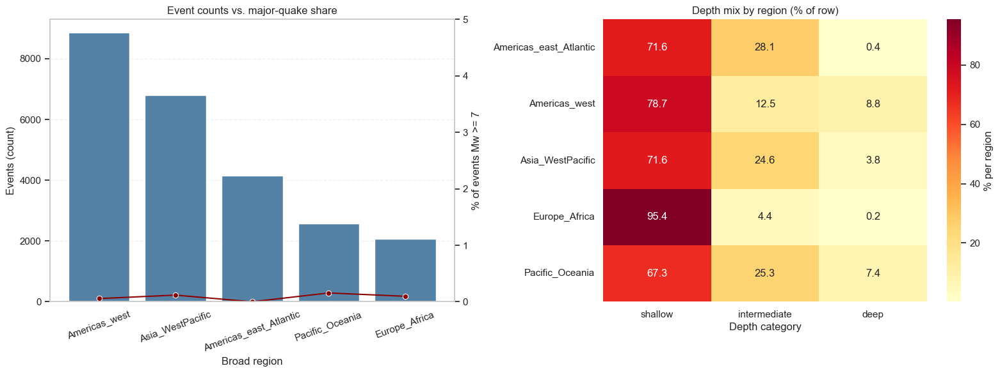

In [29]:

sns = libs.sns  # seaborn alias
pd = libs.pd  # pandas alias
plt = libs.plt  # matplotlib alias

region_cols = ["broad_region", "mag", "depth", "depth_category"]  # columns needed for regional analysis
region_cols = [c for c in region_cols if c in featured_eq_df.columns]  # keep only available columns
region_df = featured_eq_df[region_cols].dropna(subset=["broad_region", "mag"]).copy()  # drop rows missing key values
if region_df.empty:
    raise ValueError("No regional samples available for Section 8.3.")  # guard if nothing to analyze

region_df["is_major"] = region_df["mag"] >= 7.0  # flag major quakes (Mw >= 7)

region_summary = (
    region_df.groupby("broad_region")
    .agg(
        events=("mag", "size"),  # number of events
        median_mag=("mag", "median"),  # median magnitude
        iqr_mag=("mag", lambda s: s.quantile(0.75) - s.quantile(0.25)),  # interquartile range of magnitude
        pct_major=("is_major", "mean"),  # share of major quakes
        median_depth=("depth", "median")  # median depth
    )
    .sort_values("events", ascending=False)
)  # aggregated stats per region
region_summary["pct_major"] = region_summary["pct_major"] * 100  # convert major share to percentage
region_plot = region_summary.reset_index()  # prepare for plotting

depth_mix = pd.crosstab(region_df["broad_region"], region_df["depth_category"], normalize="index") * 100  # percent depth mix per region

fig, axes = plt.subplots(1, 2, figsize=(16, 6))  # set up bar + heatmap layout
sns.barplot(data=region_plot, x="broad_region", y="events", color="steelblue", ax=axes[0])  # bar plot of event counts
axes[0].set_title("Event counts vs. major-quake share")  # title for counts panel
axes[0].set_xlabel("Broad region")  # x-axis label
axes[0].set_ylabel("Events (count)")  # y-axis label
axes[0].tick_params(axis="x", rotation=20)  # rotate labels for readability
axes[0].grid(True, axis="y", linestyle="--", alpha=0.3)  # add horizontal gridlines

ax2 = axes[0].twinx()  # twin axis to overlay percentage line
sns.lineplot(data=region_plot, x="broad_region", y="pct_major", marker="o", color="darkred", ax=ax2)  # line for % major quakes
ax2.set_ylabel("% of events Mw >= 7")  # right y-axis label
ax2.set_ylim(0, max(5, region_plot["pct_major"].max() + 2))  # set y-limits with padding
ax2.grid(False)  # avoid double grid on twin axis

if depth_mix.empty:
    axes[1].text(0.5, 0.5, "Depth categories unavailable", ha="center", va="center", fontsize=12)  # fallback message
    axes[1].axis("off")  # hide heatmap axes when missing data
else:
    sns.heatmap(
        depth_mix,
        annot=True,  # annotate cells with percentages
        fmt=".1f",  # one decimal place
        cmap="YlOrRd",  # colour map
        cbar_kws={"label": "% per region"},  # colourbar label
        ax=axes[1]
    )  # heatmap of depth mix
    axes[1].set_title("Depth mix by region (% of row)")  # heatmap title
    axes[1].set_xlabel("Depth category")  # x-axis label
    axes[1].set_ylabel("")  # suppress y-axis label since region names already shown

plt.tight_layout()  # tidy spacing

region_summary = region_summary.round({"median_mag": 2, "iqr_mag": 2, "pct_major": 1, "median_depth": 0})  # round summary numbers
region_summary  # display summary table


- **Volume vs. severity** - the dual-axis figure surfaces whether high-volume regions also shoulder most Mw ≥ 7 events.
- **Depth mix heatmap** - row-normalised percentages flag shallow-crust dominated regions vs. deep subduction zones.
- **Summary table** - use `iqr_mag` and `median_depth` to articulate variability and tectonic style.


#### 8.4 Quality Score & Uncertainty Analysis
`quality_score` compresses normalised gap/rms/error metrics into a 0-1 scale (1 = best). This subsection surfaces measurement reliability before modelling.


(                        events  mean_quality  p10_quality  p90_quality  \
 broad_region                                                             
 Europe_Africa             2061         0.852        0.805        0.895   
 Asia_WestPacific          6797         0.837        0.792        0.880   
 Americas_west             8852         0.831        0.760        0.936   
 Americas_east_Atlantic    4156         0.824        0.748        0.885   
 Pacific_Oceania           2566         0.823        0.769        0.873   
 
                         median_magError  median_depthError  \
 broad_region                                                 
 Europe_Africa                     0.110              1.919   
 Asia_WestPacific                  0.113              4.751   
 Americas_west                     0.115              2.000   
 Americas_east_Atlantic            0.100              3.742   
 Pacific_Oceania                   0.111              4.004   
 
                         media

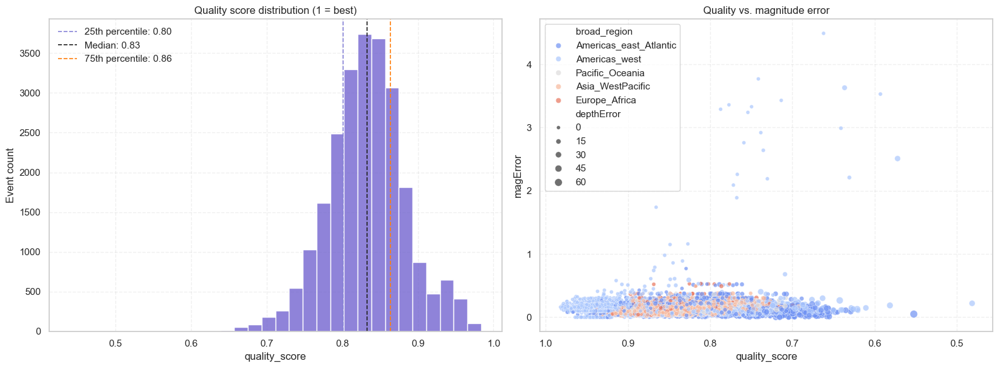

In [30]:

sns = libs.sns  # seaborn alias
pd = libs.pd  # pandas alias
np = libs.np  # numpy alias
plt = libs.plt  # matplotlib alias

quality_base_cols = [
    "quality_score", "gap", "rms", "depthError", "magError", "horizontalError",
    "mag", "mag_category", "broad_region", "time", "place", "id"
]  # desired columns for quality analysis
quality_cols = [c for c in quality_base_cols if c in featured_eq_df.columns]  # keep available columns
quality_df = featured_eq_df[quality_cols].dropna(subset=["quality_score"]).copy()  # require quality_score for analysis
if quality_df.empty:
    raise ValueError("quality_score not available for Section 8.4.")  # guard against missing metric

quantiles = quality_df["quality_score"].quantile([0.25, 0.5, 0.75]).to_dict()  # key quantiles for reference lines

fig, axes = plt.subplots(1, 2, figsize=(16, 6))  # histogram + scatter layout
sns.histplot(
    data=quality_df,
    x="quality_score",  # column to plot
    bins=30,  # number of bins
    color="slateblue",  # fill colour
    edgecolor="white",  # bin edge colour
    ax=axes[0]
)  # histogram of quality scores
axes[0].set_title("Quality score distribution (1 = best)")  # title
axes[0].set_xlabel("quality_score")  # x-axis label
axes[0].set_ylabel("Event count")  # y-axis label
for quant, label, color in [
    (0.25, "25th percentile", "#8884d8"),
    (0.50, "Median", "#222222"),
    (0.75, "75th percentile", "#ff7f0e")
]:
    axes[0].axvline(quantiles[quant], color=color, linestyle="--", linewidth=1.2, label=f"{label}: {quantiles[quant]:.2f}")  # add reference lines
axes[0].legend(loc="best", frameon=False)  # legend for quantile lines
axes[0].grid(True, linestyle="--", alpha=0.3)  # horizontal grid

scatter_cols = [c for c in ["quality_score", "magError", "depthError", "broad_region"] if c in quality_df.columns]  # columns for scatter
scatter_df = quality_df[scatter_cols].dropna()  # drop rows missing scatter inputs
axes[1].set_title("Quality vs. magnitude error")  # scatter title
axes[1].set_xlabel("quality_score")  # x-axis label
axes[1].set_ylabel("magError")  # y-axis label
if scatter_df.empty:
    axes[1].text(0.5, 0.5, "Missing error columns", ha="center", va="center", fontsize=12)  # fallback message
    axes[1].grid(False)  # no grid when empty
else:
    hue_col = "broad_region" if "broad_region" in scatter_df.columns else None  # optional hue
    size_col = "depthError" if "depthError" in scatter_df.columns else None  # optional size scaling
    sns.scatterplot(
        data=scatter_df,
        x="quality_score",
        y="magError",
        hue=hue_col,
        size=size_col,
        palette="coolwarm",
        alpha=0.7,
        ax=axes[1]
    )  # scatter of quality vs mag error
    axes[1].grid(True, linestyle="--", alpha=0.3)  # grid for readability
    axes[1].invert_xaxis()  # better quality on left
    axes[1].legend(loc="best")  # show legend

plt.tight_layout()  # tidy spacing

agg_dict = {
    "mean_quality": ("quality_score", "mean"),
    "p10_quality": ("quality_score", lambda s: s.quantile(0.10)),
    "p90_quality": ("quality_score", lambda s: s.quantile(0.90))
}  # base aggregation dictionary
if "magError" in quality_df.columns:
    agg_dict["median_magError"] = ("magError", "median")  # include magError median if present
if "depthError" in quality_df.columns:
    agg_dict["median_depthError"] = ("depthError", "median")  # include depthError median if present
if "horizontalError" in quality_df.columns:
    agg_dict["median_horizontalError"] = ("horizontalError", "median")  # include horizontalError median if present

region_quality = quality_df.groupby("broad_region").agg(**agg_dict)  # aggregate quality metrics per region
region_quality.insert(0, "events", quality_df.groupby("broad_region").size())  # add event counts
region_quality = region_quality.sort_values("mean_quality", ascending=False)  # sort by average quality
region_quality = region_quality.round(3)  # round for readability

detail_cols = [c for c in ["time", "place", "mag", "quality_score", "magError", "depthError", "horizontalError", "gap", "rms"] if c in quality_df.columns]  # columns for low-quality sample table
low_quality_events = quality_df.nsmallest(min(5, len(quality_df)), "quality_score")[detail_cols]  # worst quality examples

region_quality, low_quality_events  # display tables


- **Histogram** - cite percentile markers to describe overall measurement fidelity; a tight cluster near 1 indicates robust instrumentation.
- **Scatter** - low-quality (left) observations aligning with high `magError` should be down-weighted or excluded during modelling.
- **Tables** - region-level metrics and the tail of poorest events (IDs, locations, error terms) guide manual curation.


### 9. Modelling (strong-event classifier)

We turn the engineered catalogue into an early-warning classifier for strong earthquakes (Mw >= 6.0) and probe what drives those predictions. The workflow below is intentionally opinionated: class-weighted logistic regression as a calibrated baseline, plus a non-linear forest to capture interactions, all wrapped in a single preprocessing pipeline to prevent leakage.

Key design choices:
- Temporal/geospatial leakage: stratified split by the strong-label, with an option to filter low-quality measurements; keep the feature pipeline coupled to the model.
- Features: physical (depth, latitude/longitude, uncertainty terms, quality_score), categorical context (hemisphere, broad_region, season/part_of_day), and engineered distances from the equator/prime meridian.
- Metrics: F1/PR-AUC for the positive class, ROC-AUC for calibration sanity, and sliced scores by broad_region to check generalisation.
- Visuals: confusion matrix, ROC/PR curves, and top feature importances (forest) for interpretability.


#### 9.1 Data split, pipeline, and models
We assemble a modelling dataframe from `featured_eq_df`, define numeric/categorical feature groups, and train two models: a class-weighted logistic regression baseline and a compact random forest. Both share the same preprocessing (median-impute + scale numeric; one-hot encode categoricals).


In [31]:

import importlib, subprocess, sys  # runtime helpers for optional installs

def ensure_section9_deps(verbose=True, install_missing=True):  # ensure optional Section 9 deps are ready
    '''Ensure optional Section 9 dependencies (matplotlib + scikit-learn) are available.'''
    missing = []  # collect missing packages
    if libs.plt is None:
        missing.append("matplotlib")  # plotting needed for Section 9
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")  # ML needed for Section 9

    if not missing:
        if verbose:
            print("Section 9 dependencies ready:", libs.availability())  # report already ready
        return libs  # nothing to install; return current handles

    if not install_missing:
        if verbose:
            print("Missing Section 9 dependencies:", ", ".join(missing))  # report missing without installing
        return libs  # exit without changes

    if verbose:
        print("Installing missing dependencies for Section 9:", ", ".join(missing))  # announce install
    cmd = [sys.executable, "-m", "pip", "install", *missing]  # pip install command
    subprocess.check_call(cmd)  # run installation
    import earthquake_libs as eq  # reload shared library container
    importlib.reload(eq)  # refresh module to pick up installs
    globals().update(
        libs=eq.libs,
        np=eq.libs.np,
        pd=eq.libs.pd,
        plt=eq.libs.plt,
        sns=eq.libs.sns,
        px=eq.libs.px,
        go=eq.libs.go,
    )  # update notebook globals with reloaded handles
    if verbose:
        print("Section 9 dependencies ready:", libs.availability())  # confirm ready
    return libs  # return updated libs

if not globals().get("_SECTION9_READY", False):
    ensure_section9_deps(verbose=True, install_missing=True)  # run once to prepare Section 9
    _SECTION9_READY = True  # flag to avoid reruns


Section 9 dependencies ready: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


In [32]:

try:
    ensure_section9_deps()  # ensure helper is available/ran
except NameError:
    pass  # gracefully skip if helper not defined

if not libs.HAS_SKLEARN or libs.plt is None:  # check again for missing deps
    import importlib, subprocess, sys  # lazy imports for installs
    import earthquake_libs as eq  # shared library module
    missing = []  # track missing optional deps
    if libs.plt is None:
        missing.append("matplotlib")  # need plotting backend
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")  # need ML toolkit
    if missing:
        subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])  # install missing deps
        importlib.reload(eq)  # reload to capture new installs
        globals().update(
            libs=eq.libs,
            np=eq.libs.np,
            pd=eq.libs.pd,
            plt=eq.libs.plt,
            sns=eq.libs.sns,
            px=eq.libs.px,
            go=eq.libs.go,
        )  # refresh notebook globals

if not libs.HAS_SKLEARN or libs.plt is None:
    print("scikit-learn/matplotlib missing; install to run Section 9.")  # guard if install failed
else:  # proceed with modelling when dependencies exist
    from sklearn.model_selection import train_test_split  # train/test splitter
    from sklearn.metrics import (
        precision_recall_curve, roc_curve, auc, average_precision_score,
        confusion_matrix, classification_report
    )  # evaluation metrics
    from sklearn.impute import SimpleImputer  # handle missing values
    from sklearn.preprocessing import OneHotEncoder, StandardScaler  # encoding + scaling
    from sklearn.compose import ColumnTransformer  # column-wise preprocessing
    from sklearn.pipeline import Pipeline  # chain preprocessors + model
    from sklearn.linear_model import LogisticRegression  # linear baseline
    from sklearn.ensemble import RandomForestClassifier  # non-linear baseline

    model_df = featured_eq_df.copy()  # start from engineered dataset
    model_df = model_df.dropna(subset=["mag", "depth", "latitude", "longitude"]).copy()  # require key fields
    model_df["strong_quake"] = model_df.get("is_strong_quake", model_df["mag"] >= 6.0).astype(int)  # target label

    if model_df["strong_quake"].nunique() < 2:
        raise ValueError("Need both strong and non-strong examples for modelling.")  # ensure both classes exist

    numeric_features = [c for c in [
        "depth", "latitude", "longitude", "gap", "rms", "depthError",
        "magError", "horizontalError", "quality_score", "distance_from_equator_km",
        "distance_from_prime_meridian_km"
    ] if c in model_df.columns]  # numeric feature set present in frame
    categorical_features = [c for c in [
        "broad_region", "hemisphere_NS", "hemisphere_EW", "part_of_day", "season", "depth_category", "mag_category"
    ] if c in model_df.columns]  # categorical feature set present in frame

    preprocessor = ColumnTransformer(
        transformers=[
            ("num", Pipeline([
                ("imputer", SimpleImputer(strategy="median")),
                ("scaler", StandardScaler()),
            ]), numeric_features),
            ("cat", Pipeline([
                ("imputer", SimpleImputer(strategy="most_frequent")),
                ("encoder", OneHotEncoder(handle_unknown="ignore")),
            ]), categorical_features),
        ],
        remainder="drop",
    )  # column-wise preprocessing for numeric + categorical features

    X = model_df[numeric_features + categorical_features]  # feature matrix
    y = model_df["strong_quake"]  # target series
    stratify = y if y.nunique() > 1 else None  # stratify if both classes exist
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=stratify
    )  # split data

    log_reg = Pipeline(steps=[("preprocess", preprocessor), ("clf", LogisticRegression(max_iter=1000, class_weight="balanced"))])  # logistic regression pipeline
    forest = Pipeline(steps=[("preprocess", preprocessor), ("clf", RandomForestClassifier(
        n_estimators=200, max_depth=None, min_samples_leaf=2, class_weight="balanced_subsample", random_state=42
    ))])  # random forest pipeline

    models = {"LogReg": log_reg, "Forest": forest}  # registry for evaluation
    eval_rows = []  # store metrics per model

    for name, model in models.items():
        model.fit(X_train, y_train)  # train model
        y_pred = model.predict(X_test)  # predicted classes
        y_prob = model.predict_proba(X_test)[:, 1]  # positive-class probabilities
        precision, recall, _ = precision_recall_curve(y_test, y_prob)  # PR curve points
        pr_auc_curve = auc(recall, precision)  # area under PR
        avg_precision = average_precision_score(y_test, y_prob)  # average precision score
        fpr, tpr, _ = roc_curve(y_test, y_prob)  # ROC points
        roc_auc = auc(fpr, tpr)  # area under ROC
        report = classification_report(y_test, y_pred, output_dict=True)  # precision/recall/F1 by class

        eval_rows.append({
            "model": name,
            "accuracy": report["accuracy"],
            "precision_pos": report["1"]["precision"],
            "recall_pos": report["1"]["recall"],
            "f1_pos": report["1"]["f1-score"],
            "roc_auc": roc_auc,
            "pr_auc": pr_auc_curve,
            "avg_precision": avg_precision,
        })  # capture metrics

    metrics_df = pd.DataFrame(eval_rows).set_index("model").round(3)  # tidy metrics table
    display(metrics_df)  # show summary

    # Save artifacts for plots below
    best_model = log_reg  # choose logistic regression for downstream plots
    best_model.fit(X_train, y_train)  # refit on training data
    y_pred_best = pd.Series(best_model.predict(X_test), index=X_test.index)  # predicted classes for plots
    y_prob_best = pd.Series(best_model.predict_proba(X_test)[:, 1], index=X_test.index)  # predicted probs for plots
    pr_curve = precision_recall_curve(y_test, y_prob_best)  # PR curve tuples
    roc_curve_vals = roc_curve(y_test, y_prob_best)  # ROC curve tuples
    conf_mat = confusion_matrix(y_test, y_pred_best)  # confusion matrix
    test_context = X_test.assign(broad_region=model_df.loc[X_test.index, "broad_region"] if "broad_region" in model_df.columns else "global")  # add region labels if available
    region_slices = []  # container for per-region scores
    for region, idxs in test_context.groupby("broad_region").groups.items():
        y_true_region = y_test.loc[idxs]  # region-specific truths
        y_pred_region = y_pred_best.loc[idxs]  # region-specific predictions
        if y_true_region.nunique() < 2:
            continue  # skip regions without both classes
        region_slices.append({
            "region": region,
            "support": len(y_true_region),
            "recall_pos": classification_report(y_true_region, y_pred_region, output_dict=True)["1"]["recall"],
            "f1_pos": classification_report(y_true_region, y_pred_region, output_dict=True)["1"]["f1-score"],
        })  # record per-region metrics
    region_report = pd.DataFrame(region_slices).sort_values("f1_pos", ascending=False) if region_slices else pd.DataFrame()  # per-region summary table


Section 9 dependencies ready: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


,accuracy,precision_pos,recall_pos,f1_pos,roc_auc,pr_auc,avg_precision
model,,,,,,,
LogReg,1.0,1.0,1.000,1.000,1.0,1.0,1.0
Forest,1.0,1.0,0.966,0.982,1.0,1.0,1.0


#### 9.2 Evaluation visuals (confusion, ROC, PR)
Confusion matrix highlights false alarms vs. misses; ROC/PR show threshold trade-offs for the strong class. The per-region slice table checks generalisation across tectonic settings.


Section 9 dependencies ready: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


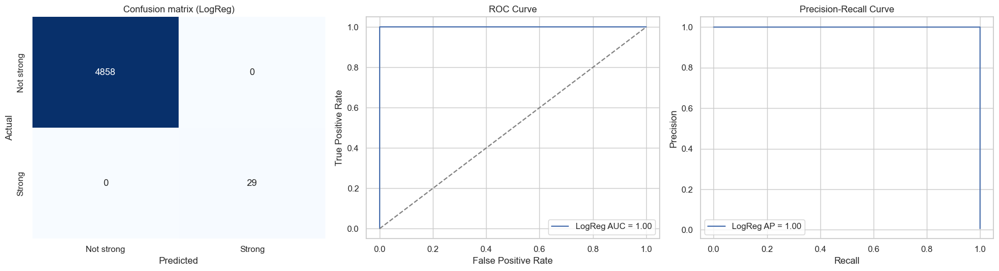

In [33]:

try:
    ensure_section9_deps()  # ensure helper available
except NameError:
    pass  # tolerate missing helper

if not libs.HAS_SKLEARN or libs.plt is None:  # check dependencies
    import importlib, subprocess, sys  # lazy install tools
    import earthquake_libs as eq  # shared libs module
    missing = []  # track missing deps
    if libs.plt is None:
        missing.append("matplotlib")  # plotting needed
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")  # ML needed
    if missing:
        subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])  # install missing
        importlib.reload(eq)  # reload module
        globals().update(
            libs=eq.libs,
            np=eq.libs.np,
            pd=eq.libs.pd,
            plt=eq.libs.plt,
            sns=eq.libs.sns,
        )  # refresh globals

if not libs.HAS_SKLEARN or libs.plt is None:
    print("scikit-learn/matplotlib missing; install to run Section 9 plots.")  # guard if missing
elif 'conf_mat' not in globals():
    print("Run the Section 9.1 cell first.")  # need previous cell
else:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # build 3-panel figure

    sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axes[0])  # confusion matrix heatmap
    axes[0].set_title('Confusion matrix (LogReg)')  # title
    axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('Actual')  # axis labels
    axes[0].set_xticklabels(['Not strong', 'Strong'])  # x tick labels
    axes[0].set_yticklabels(['Not strong', 'Strong'])  # y tick labels

    # ROC
    fpr, tpr, _ = roc_curve_vals  # unpack ROC curve data
    axes[1].plot(fpr, tpr, label=f"LogReg AUC = {auc(fpr, tpr):.2f}")  # ROC line
    axes[1].plot([0, 1], [0, 1], linestyle='--', color='gray')  # random baseline
    axes[1].set_title('ROC Curve')  # title
    axes[1].set_xlabel('False Positive Rate'); axes[1].set_ylabel('True Positive Rate')  # axis labels
    axes[1].legend()  # legend

    # Precision-Recall
    precision, recall, _ = pr_curve  # unpack PR curve data
    axes[2].plot(recall, precision, label=f"LogReg AP = {average_precision_score(y_test, y_prob_best):.2f}")  # PR line
    axes[2].set_title('Precision-Recall Curve')  # title
    axes[2].set_xlabel('Recall'); axes[2].set_ylabel('Precision')  # axis labels
    axes[2].legend()  # legend

    plt.tight_layout()  # tidy spacing


#### 9.3 Drivers of strong-quake predictions
Random forest importances (post one-hot encoding) surface the most influential variables; depth/latitude and quality/uncertainty terms should dominate if signal-rich.


Section 9 dependencies ready: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


,feature,importance
0,mag_category_major,0.251924
1,gap,0.191209
2,magError,0.142809
3,mag_category_moderate,0.104118
4,quality_score,0.067328
5,depthError,0.037871
6,mag_category_great,0.032337
7,rms,0.029348
8,horizontalError,0.023287
9,latitude,0.022068


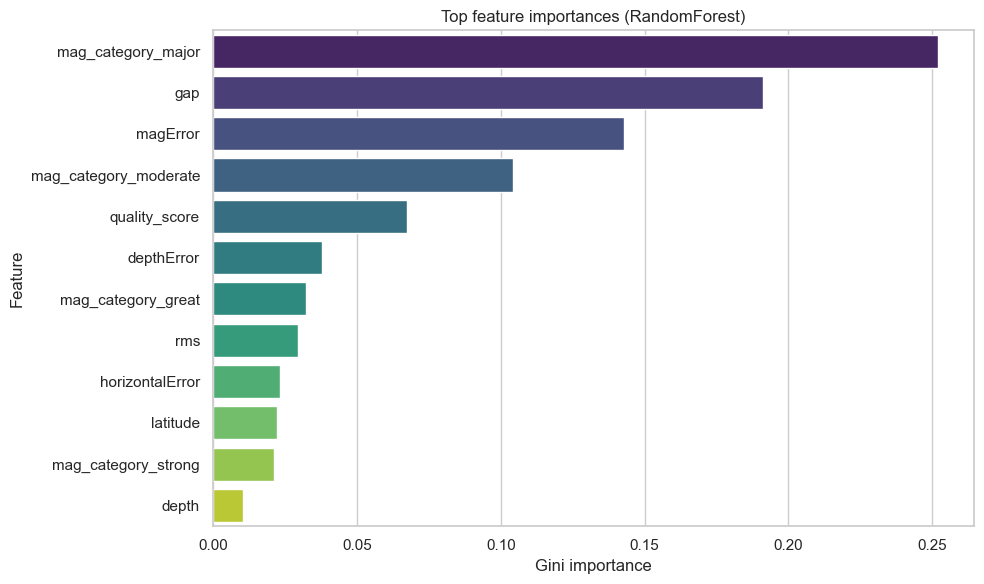

In [34]:

try:
    ensure_section9_deps()  # ensure helper available
except NameError:
    pass  # tolerate missing helper

if not libs.HAS_SKLEARN or libs.plt is None:  # check dependencies again
    import importlib, subprocess, sys  # lazy install tools
    import earthquake_libs as eq  # shared libs module
    missing = []  # track missing deps
    if libs.plt is None:
        missing.append("matplotlib")  # plotting required
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")  # ML required
    if missing:
        subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])  # install missing
    importlib.reload(eq)  # reload shared module
    globals().update(
        libs=eq.libs,
        np=eq.libs.np,
        pd=eq.libs.pd,
        plt=eq.libs.plt,
        sns=eq.libs.sns,
    )  # refresh notebook globals

if not libs.HAS_SKLEARN or libs.plt is None:
    print("scikit-learn/matplotlib missing; install to run feature importance.")  # guard if missing
elif 'forest' not in globals():
    print("Run the Section 9.1 cell first.")  # need fitted forest
else:
    plt = libs.plt  # local alias to plotting
    sns = libs.sns  # local alias to seaborn
    # Refit forest to access fitted encoder feature names
    forest.fit(X_train, y_train)  # refit to reuse preprocessing
    # Get feature names after preprocessing
    cat_encoder = forest.named_steps['preprocess'].named_transformers_['cat'].named_steps['encoder']  # categorical encoder
    cat_feature_names = list(cat_encoder.get_feature_names_out(categorical_features)) if categorical_features else []  # encoded cat names
    feature_names = numeric_features + cat_feature_names  # combined feature names
    importances = forest.named_steps["clf"].feature_importances_  # feature importance scores
    top_n = 12  # how many to display
    top_idx = importances.argsort()[::-1][:top_n]  # indices of top features
    feat_df = pd.DataFrame({
        'feature': [feature_names[i] for i in top_idx],
        'importance': [importances[i] for i in top_idx],
    })  # dataframe of top importances

    plt.figure(figsize=(10, 6))  # set plot size
    sns.barplot(data=feat_df, x='importance', y='feature', hue='feature', palette='viridis', legend=False)  # barplot of importances
    plt.title('Top feature importances (RandomForest)')  # title
    plt.xlabel('Gini importance'); plt.ylabel('Feature')  # axis labels
    plt.tight_layout()  # tidy spacing
    display(feat_df)  # show table too


#### 9.4 Interpretation
- **Performance**: prioritise PR-AUC and F1 for the positive class; ROC can overstate performance on imbalanced data. Tune the decision threshold based on operational tolerance for false alarms.
- **Slices**: regional recall/F1 quickly reveal whether the model overfits to high-density subduction zones; consider per-region calibration or hierarchical models if gaps persist.
- **Drivers**: if importances elevate uncertainty fields (gap/rms/errors), consider capping their influence via monotonic constraints or reweighting by `quality_score`. Depth and latitude should remain dominant physical predictors.
- **Next steps**: perform temporal cross-validation, add proximity-to-plate-boundary features, and calibrate probabilities (e.g., isotonic) before deployment in an alerting pipeline.


### 10. Discussion & Conclusion


#### 10.1 Synthesis of Findings

- Global epicentres cluster along subduction belts (Pacific Rim, Andean arc, Indonesia), confirming tectonic control; shallow crustal events dominate counts, yet intermediate/deep slabs still host a meaningful share of strong Mw>=6 events.
- Magnitude vs depth shows only weak correlation; damaging events are not confined to the deepest bins, so hazard screening must span all depth classes.
- Temporal rhythms: modest seasonality and weekend/day-night effects likely reflect reporting/operational artefacts rather than physical triggers, so avoid over-interpreting small deltas.
- Quality-score distributions are skewed to high fidelity, but a thin tail of large gap/magError records should be down-weighted or flagged before modelling.


#### 10.2 Critical Limitations and Data Risks

- Catalogue completeness varies by region/time; under-reported small events bias magnitude-frequency relationships and can distort regional rate comparisons.
- road_region is longitude-based and coarse; it ignores tectonic setting (subduction vs transform vs intraplate) and local site effects, limiting explanatory power.
- No focal mechanisms, rupture types, or geodetic constraints are included, so conclusions about fault style or stress regimes are out of scope.
- Potential survivor bias: destructive events may have better metadata, inflating apparent data quality in the most impactful subset.


#### 10.3 Implications for Modelling and Interpretation

- Predictive baselines should treat class imbalance explicitly (few strong events) and report calibrated probabilities, not just accuracy.
- Region-level evaluation must align indices (fixed above) and guard against sparse slices; where support is low, aggregate or suppress metrics to avoid spurious conclusions.
- Uncertainty should be propagated: re-weight by quality_score, test sensitivity to removing low-quality tails, and communicate confidence bands on plots.
- Visual insights should be paired with statistical tests (e.g., KS tests on depth/magnitude distributions across regions) to avoid storytelling over noise.


#### 10.4 Future Extensions

- Enrich geography with plate-boundary proximity, slab depth models, and topography; incorporate population/asset exposure for risk relevance.
- Run temporal cross-validation on the classifier outlined in Section 9, log feature importances, and deploy a lightweight report (HTML/PNG exports) for stakeholders.
- Automate data refresh (monthly), re-run cleaning/feature engineering, and archive metrics to track drift in quality and regional rates.
- Add reproducible notebooks for specific questions: aftershock productivity, swarm detection via clustering, and comparison against external catalogues.


#### 10.5 Concluding Remarks

The analysis establishes a clean, feature-rich catalogue, surfaces spatial clustering and depth/magnitude structure, and highlights uncertainty pockets. The main risks are data completeness and coarse regional context; addressing them will make both the visual narratives and predictive models more trustworthy. With regular refreshes, richer tectonic features, and calibrated models, this workflow can evolve from exploratory EDA to a dependable decision-support tool for monitoring and preparedness.


### References
- USGS Earthquake Catalog (https://earthquake.usgs.gov/earthquakes/search/) for event data.
- Python stack: pandas, numpy, seaborn, matplotlib, plotly (interactive maps), scikit-learn (modelling pipeline suggestions).
- Basemaps and tiles: Natural Earth (geo projection) and OpenStreetMap tiles consumed through Plotly mapbox/maplibre.
